# Differential abundance analysis

#### Working directory should contain integrated Seurat object of WT and mutants, which is available on GEO under record GSE152766:

    rc.integrated_wt_shr_scr.rds
    
#### Working directory must contain subdirectories,supp_data

#### supp_data/ should contain the files, which are available on Github (github.com/Hsu-Che-Wei/COPILOT):

    features.tsv.gz

#### The file 'Benfey_single_cell-Samples.csv' contains the meta data of samples, which is not provided. But one can find an example of such file in Supplementary Dataset 1 (Shahan & Hsu et al. 2020)

In [1]:
rm(list=ls())
# Set the working directory to where folders named after the samples are located. 
# The folder contains spliced.mtx, unspliced.mtx, barcodes and gene id files, and json files produced by scKB that documents the sequencing stats. 
setwd("/scratch/AG_Ohler/CheWei/scKB")

In [1]:
# Load libraries
library(edgeR)
library(tidyverse)
library(Seurat)
library(cowplot)
library(ComplexHeatmap)
library(circlize)
library(GeneOverlap)
library(gprofiler2)
library(ggrepel)
library(ggplot2)
library(scater)
library(RColorBrewer)

Loading required package: limma

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.0     ✔ purrr   0.3.3
✔ tibble  3.0.1     ✔ dplyr   0.8.5
✔ tidyr   1.0.2     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.5.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


********************************************************

Note: As of version 1.0.0, cowplot does not change the

  default ggplot2 theme anymore. To recover the previous

  behavior, execute:
  theme_set(theme_cowplot())

********************************************************


Loading required package: grid

ComplexHeatmap version 2.2.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please ci

In [2]:
library(future)
#for 300gb ram 
options(future.globals.maxSize = 300000 * 1024^2)


Attaching package: ‘future’


The following object is masked from ‘package:SummarizedExperiment’:

    values


The following object is masked from ‘package:GenomicRanges’:

    values


The following object is masked from ‘package:IRanges’:

    values


The following object is masked from ‘package:S4Vectors’:

    values




In [3]:
rc.integrated <- readRDS("./rc.integrated_wt_shr_scr.rds")

In [4]:
feature_names <- read_tsv("./supp_data/features.tsv.gz", col_names = c("AGI", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

Parsed with column specification:
cols(
  AGI = col_character(),
  Name = col_character(),
  Type = col_character()
)



## 1. Add metadata and organize by genotype and experiment date

In [5]:
  bscs <- read.csv("./Benfey_single_cell-Samples.csv", na.strings=c("","NA"), stringsAsFactors = F)
  bscs <- bscs %>% select(c('sample','name','source','geno', 'genotype','transgene','treatment','age','timepoint','rep','target_cells','date','seq_run'))
  bscs$date <- gsub('^([0-9]{4})([0-9]{2})([0-9]+)$', '\\1-\\2-\\3', bscs$date)
  bscs$target_cells <- prettyNum(bscs$target_cells, big.mark = ',')

orig.idents <- data.frame(sample=rc.integrated$orig.ident)

bscs %>% filter(sample %in% orig.idents$sample)

sample,name,source,geno,genotype,transgene,treatment,age,timepoint,rep,target_cells,date,seq_run
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_20,WT Col-0_RS1,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",NA,Shahan_6177
sc_21,WT Col-0_RS2,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",NA,Shahan_6177
sc_25,scr-4_1,Benfey lab,scr-4,scr-4 (Ws backcrossed to Col?),NA,Untreated,5_day,NA,NA,"10,000",NA,Shahan_6177
sc_30,WT Col-0_RS3,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2020-02-10,Nolan_6199 (NextSeq); Nolan_6226 (NovaSeq S4)
sc_31,WT Col-0_RS4,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2020-02-10,Nolan_6199 (NextSeq); Nolan_6226 (NovaSeq S4)
sc_36,scr_4_2,Benfey lab,scr-4,scr-4,NA,Untreated,5_day,NA,NA,"10,000",2020-02-10,Nolan_6199 (NextSeq); Nolan_6226 (NovaSeq S4)
sc_51,WT Col (RS_5),Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2020-02-24,Nolan_6226
sc_52,shr-2,Benfey lab,shr-2,shr-2,NA,Untreated,5_day,NA,NA,"10,000",2020-02-24,Nolan_6226


In [6]:
orig.idents_info <- left_join(orig.idents, bscs, by="sample")
orig.idents_info 

Warning message:
“Column `sample` joining factor and character vector, coercing into character vector”


sample,name,source,geno,genotype,transgene,treatment,age,timepoint,rep,target_cells,date,seq_run
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158
sc_12,WT Col-0 untreated,Benfey lab,WT,WT Col-0,NA,Untreated,5_day,NA,NA,"10,000",2019-12-20,Nolan_6131;Shahan_6158


In [7]:
treatment <- orig.idents_info$treatment
names(treatment) <- colnames(rc.integrated)
head(treatment)
rc.integrated <- AddMetaData(
  object = rc.integrated,
  metadata = treatment,
  col.name = 'treatment')


timepoint <- orig.idents_info$timepoint
names(timepoint) <- colnames(rc.integrated)

rc.integrated <- AddMetaData(
  object = rc.integrated,
  metadata = timepoint,
  col.name = 'timepoint')



age <- orig.idents_info$age
names(age) <- colnames(rc.integrated)
rc.integrated <- AddMetaData(
  object = rc.integrated,
  metadata = age,
  col.name = 'age')



rep <- orig.idents_info$rep
names(rep) <- colnames(rc.integrated)

rc.integrated <- AddMetaData(
  object = rc.integrated,
  metadata = rep,
  col.name = 'rep')

date <- orig.idents_info$date
names(date) <- colnames(rc.integrated)

rc.integrated <- AddMetaData(
  object = rc.integrated,
  metadata = date,
  col.name = 'date')

geno <- orig.idents_info$geno

names(geno) <- colnames(rc.integrated)

rc.integrated <- AddMetaData(
  object = rc.integrated,
  metadata = geno,
  col.name = 'geno')

AAACCCAAGCCATTCA_1 AAACCCAAGCTGTTCA_1 AAACCCAAGGCGAACT_1 AAACCCACACCAGCCA_1 
       "Untreated"        "Untreated"        "Untreated"        "Untreated" 
AAACCCACACTGGCGT_1 AAACCCACAGACCTGC_1 
       "Untreated"        "Untreated"

In [8]:
table(rc.integrated$treatment)


Untreated 
    86260 

In [9]:
table(rc.integrated$geno)


scr-4 shr-2    WT 
13742 14612 57906 

In [10]:
rc.integrated$geno_trt <- rep("WT")
rc.integrated$geno_trt[rc.integrated$geno=="WT"] <- "WT"
rc.integrated$geno_trt[rc.integrated$geno=="shr-2"] <- "shr"
rc.integrated$geno_trt[rc.integrated$geno=="scr-4"] <- "scr"
rc.integrated$geno_trt <- factor(rc.integrated$geno_trt, levels=c("WT", "shr", "scr"))

In [11]:
table(rc.integrated$geno_trt)


   WT   shr   scr 
57906 14612 13742 

In [12]:
table(rc.integrated$celltype.anno)


Putative Quiescent Center           Stem Cell Niche                 Columella 
                      397                       831                     10548 
         Lateral Root Cap              Atrichoblast               Trichoblast 
                    13856                     11362                     10742 
                   Cortex                Endodermis                 Pericycle 
                     9719                      6064                      6379 
                   Phloem                     Xylem                Procambium 
                     4095                      3964                      8303 

In [13]:
# Simple QC label
rc.integrated$celltype.anno <- gsub("Putative Quiescent Center", "Quiescent Center", rc.integrated$celltype.anno, ignore.case = FALSE, perl = FALSE,
     fixed = T, useBytes = FALSE)

order <- c("Quiescent Center", "Stem Cell Niche", "Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Pericycle", "Phloem", "Xylem", "Procambium", "Unknown")
palette <- c("#9400D3","#DCD0FF", "#5AB953", "#BFEF45", "#008080", "#21B6A8", "#82B6FF", "#0000FF","#FF9900","#E6194B", "#9A6324", "#FFE119","#EEEEEE")
rc.integrated$celltype.anno <- factor(rc.integrated$celltype.anno, levels = order[sort(match(unique(rc.integrated$celltype.anno),order))])
color <- palette[sort(match(unique(rc.integrated$celltype.anno),order))]

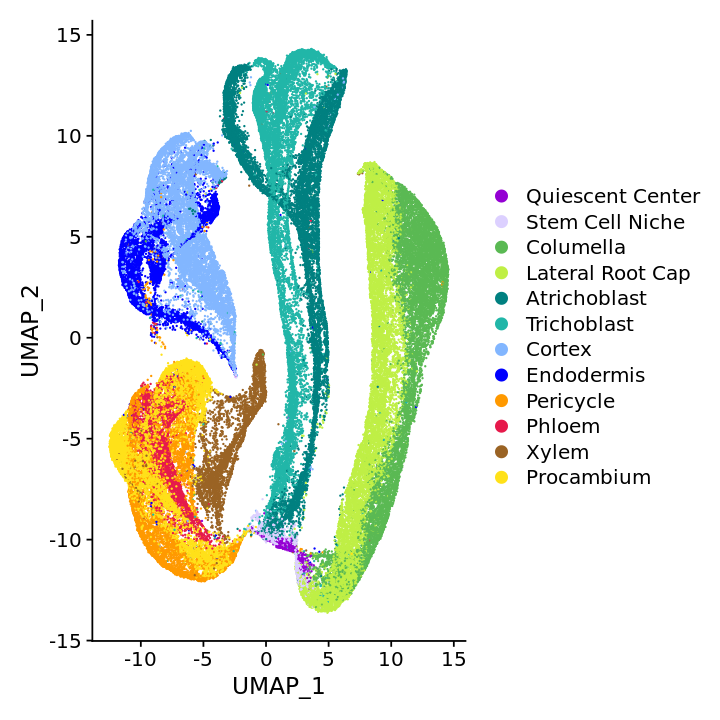

In [14]:
options(repr.plot.width=6, repr.plot.height=6)
DimPlot(rc.integrated, reduction = "umap", group.by = "celltype.anno", cols=color)

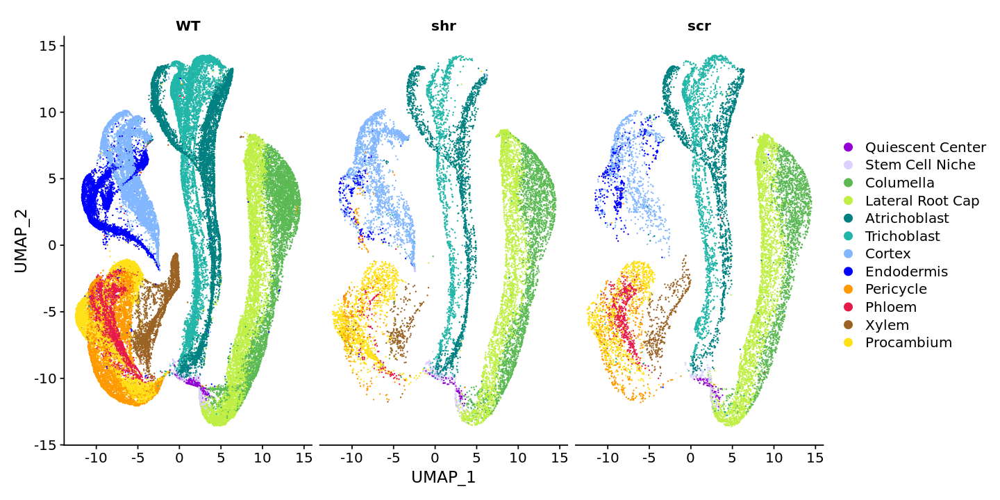

In [15]:
options(repr.plot.width=12, repr.plot.height=6)
DimPlot(rc.integrated, reduction = "umap", group.by = "celltype.anno", split.by="geno_trt", cols=color)

## 2. Draw a heatmap of each celltype's numbers 

In [16]:
sample_num_df <- data.frame(table(rc.integrated$geno_trt))

sample_num_df <- dplyr::rename(sample_num_df, "total_cells"="Freq", "orig.id"="Var1")

sample_num_df

rc.integrated$sample.cell.p <- paste(rc.integrated$geno_trt, rc.integrated$celltype.anno, sep = ",")

sample_cell_df <- data.frame(table(rc.integrated$sample.cell.p))

sample_cell_df <- separate(sample_cell_df, col="Var1", sep=",", into=c("orig.id", "celltype")) %>%
  dplyr::rename("n_celltype"="Freq") %>%
  left_join(sample_num_df) %>%
  mutate(proportion=n_celltype/total_cells)

sample_cell_df

wt_cells <- filter(sample_cell_df, orig.id == "WT") %>%
  group_by(celltype) %>%
  summarise(wt_prop=mean(proportion))

wt_cells

sample_cell_df <- left_join(sample_cell_df, wt_cells) %>%
  mutate(wt_norm_prop=proportion/wt_prop)

sample_cell_df


sample_cell_wide <- sample_cell_df %>%
  ungroup() %>%
  select(orig.id, celltype, wt_norm_prop) %>%
  pivot_wider(names_from = celltype, values_from = wt_norm_prop)

sample_cell_wide

sample_cell_wide[is.na(sample_cell_wide)==T] <- 0.0000001

sample_cell_wide

cell_m <- as.matrix(log2(sample_cell_wide[, -1]))
rownames(cell_m) <- sample_cell_wide$orig.id

cell_m

orig.id,total_cells
<fct>,<int>
WT,57906
shr,14612
scr,13742


Joining, by = "orig.id"

Warning message:
“Column `orig.id` joining character vector and factor, coercing into character vector”


orig.id,celltype,n_celltype,total_cells,proportion
<chr>,<chr>,<int>,<int>,<dbl>
scr,Atrichoblast,2009,13742,0.146194149
scr,Columella,2161,13742,0.157255130
scr,Cortex,946,13742,0.068840052
scr,Endodermis,361,13742,0.026269830
scr,Lateral Root Cap,3637,13742,0.264663077
scr,Pericycle,453,13742,0.032964634
scr,Phloem,566,13742,0.041187600
scr,Procambium,986,13742,0.071750837
scr,Quiescent Center,81,13742,0.005894339


celltype,wt_prop
<chr>,<dbl>
Atrichoblast,0.125876420
Columella,0.094964252
Cortex,0.112389044
Endodermis,0.095206024
Lateral Root Cap,0.120367492
Pericycle,0.096846613
Phloem,0.058664042
Procambium,0.101094878
Quiescent Center,0.004196456


Joining, by = "celltype"



orig.id,celltype,n_celltype,total_cells,proportion,wt_prop,wt_norm_prop
<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
scr,Atrichoblast,2009,13742,0.146194149,0.125876420,1.1614101
scr,Columella,2161,13742,0.157255130,0.094964252,1.6559403
scr,Cortex,946,13742,0.068840052,0.112389044,0.6125157
scr,Endodermis,361,13742,0.026269830,0.095206024,0.2759261
scr,Lateral Root Cap,3637,13742,0.264663077,0.120367492,2.1987920
scr,Pericycle,453,13742,0.032964634,0.096846613,0.3403798
scr,Phloem,566,13742,0.041187600,0.058664042,0.7020928
scr,Procambium,986,13742,0.071750837,0.101094878,0.7097376
scr,Quiescent Center,81,13742,0.005894339,0.004196456,1.4045990


orig.id,Atrichoblast,Columella,Cortex,Endodermis,Lateral Root Cap,Pericycle,Phloem,Procambium,Quiescent Center,Stem Cell Niche,Trichoblast,Xylem
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
scr,1.161410,1.655940,0.6125157,0.2759261,2.198792,0.3403798,0.7020928,0.7097376,1.404599,1.761940,1.1121643,0.5534190
shr,1.122162,2.081265,1.3792232,0.1365776,1.847272,0.2247155,0.1539899,0.9903883,1.190503,2.675212,0.7500145,0.3710633
WT,1.000000,1.000000,1.0000000,1.0000000,1.000000,1.0000000,1.0000000,1.0000000,1.000000,1.000000,1.0000000,1.0000000


orig.id,Atrichoblast,Columella,Cortex,Endodermis,Lateral Root Cap,Pericycle,Phloem,Procambium,Quiescent Center,Stem Cell Niche,Trichoblast,Xylem
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
scr,1.161410,1.655940,0.6125157,0.2759261,2.198792,0.3403798,0.7020928,0.7097376,1.404599,1.761940,1.1121643,0.5534190
shr,1.122162,2.081265,1.3792232,0.1365776,1.847272,0.2247155,0.1539899,0.9903883,1.190503,2.675212,0.7500145,0.3710633
WT,1.000000,1.000000,1.0000000,1.0000000,1.000000,1.0000000,1.0000000,1.0000000,1.000000,1.000000,1.0000000,1.0000000


,Atrichoblast,Columella,Cortex,Endodermis,Lateral Root Cap,Pericycle,Phloem,Procambium,Quiescent Center,Stem Cell Niche,Trichoblast,Xylem
scr,0.2158775,0.7276506,-0.7071813,-1.857646,1.1367111,-1.554783,-0.5102664,-0.49464234,0.4901584,0.8171651,0.1533699,-0.853556
shr,0.1662813,1.0574606,0.4638560,-2.872207,0.8853963,-2.153828,-2.6990922,-0.01393379,0.2515712,1.4196532,-0.4150096,-1.430263
WT,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.000000,0.0000000,0.00000000,0.0000000,0.0000000,0.0000000,0.000000


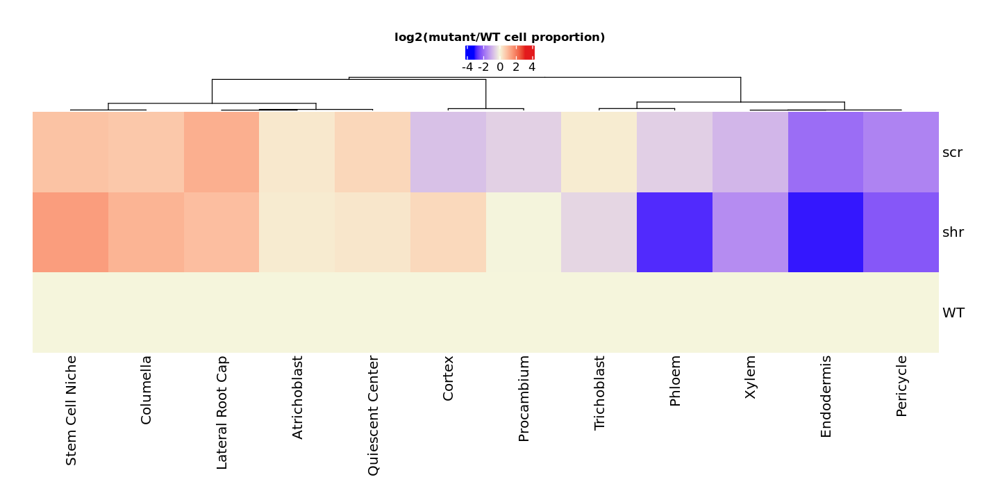

In [17]:

# add to hm cell_fun = function(j, i, x, y, width, height, fill) {grid.text(sprintf("%.0f", int_matrix[i, j]), x, y, gp = gpar(fontsize = 10))})

Cell_hm <- Heatmap(cell_m, name = "log2(mutant/WT cell proportion)", 
                   heatmap_legend_param = list(title_position="topcenter", 
                                               color_bar = "continuous", 
                                               legend_direction = "horizontal"), 
                   col = colorRamp2(c(-3, 0, 3), c("blue", "beige", "#e31a1c")), 
                   cluster_rows = F, 
                   cluster_columns = T, 
                   use_raster= FALSE, 
                   show_column_names = TRUE, show_row_names = TRUE, show_row_dend = TRUE, show_column_dend = TRUE,
                   clustering_distance_rows = "pearson", clustering_distance_columns = "pearson",
                 row_names_gp = gpar(fontsize = 12)) 


draw(Cell_hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [18]:
sample_num_df <- data.frame(table(rc.integrated$orig.ident))

sample_num_df <- dplyr::rename(sample_num_df, "total_cells"="Freq", "orig.id"="Var1")

sample_num_df

rc.integrated$sample.cell.p <- paste(rc.integrated$orig.ident, rc.integrated$celltype.anno, sep = ",")

sample_cell_df <- data.frame(table(rc.integrated$sample.cell.p))

sample_cell_df <- separate(sample_cell_df, col="Var1", sep=",", into=c("orig.id", "celltype")) %>%
  dplyr::rename("n_celltype"="Freq") %>%
  left_join(sample_num_df) %>%
  mutate(proportion=n_celltype/total_cells)

sample_cell_df

wt_cells <- filter(sample_cell_df, orig.id %in% c("sc_12", "sc_20", "sc_21", "sc_30", "sc_31", "sc_51")) %>%
  group_by(celltype) %>%
  summarise(wt_prop=mean(proportion))

wt_cells

sample_cell_df <- left_join(sample_cell_df, wt_cells) %>%
  mutate(wt_norm_prop=proportion/wt_prop)

sample_cell_df


sample_cell_wide <- sample_cell_df %>%
  ungroup() %>%
  select(orig.id, celltype, wt_norm_prop) %>%
  pivot_wider(names_from = celltype, values_from = wt_norm_prop)

sample_cell_wide

sample_cell_wide[is.na(sample_cell_wide)==T] <- 0.0000001

sample_cell_wide

cell_m <- as.matrix(log2(sample_cell_wide[, -1]))
rownames(cell_m) <- sample_cell_wide$orig.id

cell_m

orig.id,total_cells
<fct>,<int>
sc_12,10293
sc_20,12591
sc_21,9658
sc_25,7736
sc_30,10195
sc_31,8775
sc_36,6006
sc_51,6394
sc_52,6241


Joining, by = "orig.id"

Warning message:
“Column `orig.id` joining character vector and factor, coercing into character vector”


orig.id,celltype,n_celltype,total_cells,proportion
<chr>,<chr>,<int>,<int>,<dbl>
sc_12,Atrichoblast,1351,10293,0.131254250
sc_12,Columella,1309,10293,0.127173807
sc_12,Cortex,1146,10293,0.111337802
sc_12,Endodermis,664,10293,0.064509861
sc_12,Lateral Root Cap,1328,10293,0.129019722
sc_12,Pericycle,1159,10293,0.112600797
sc_12,Phloem,410,10293,0.039832896
sc_12,Procambium,1096,10293,0.106480132
sc_12,Quiescent Center,48,10293,0.004663363


celltype,wt_prop
<chr>,<dbl>
Atrichoblast,0.124761278
Columella,0.096459978
Cortex,0.112091770
Endodermis,0.096918446
Lateral Root Cap,0.123867450
Pericycle,0.096059388
Phloem,0.058352882
Procambium,0.100091969
Quiescent Center,0.004538212


Joining, by = "celltype"



orig.id,celltype,n_celltype,total_cells,proportion,wt_prop,wt_norm_prop
<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
sc_12,Atrichoblast,1351,10293,0.131254250,0.124761278,1.0520432
sc_12,Columella,1309,10293,0.127173807,0.096459978,1.3184101
sc_12,Cortex,1146,10293,0.111337802,0.112091770,0.9932737
sc_12,Endodermis,664,10293,0.064509861,0.096918446,0.6656097
sc_12,Lateral Root Cap,1328,10293,0.129019722,0.123867450,1.0415950
sc_12,Pericycle,1159,10293,0.112600797,0.096059388,1.1721998
sc_12,Phloem,410,10293,0.039832896,0.058352882,0.6826209
sc_12,Procambium,1096,10293,0.106480132,0.100091969,1.0638229
sc_12,Quiescent Center,48,10293,0.004663363,0.004538212,1.0275773


orig.id,Atrichoblast,Columella,Cortex,Endodermis,Lateral Root Cap,Pericycle,Phloem,Procambium,Quiescent Center,Stem Cell Niche,Trichoblast,Xylem
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
sc_12,1.0520432,1.3184101,0.9932737,0.6656097,1.0415950,1.1721998,0.6826209,1.0638229,1.0275773,0.8860644,1.0229582,0.7132197
sc_20,0.9905344,0.9188758,0.9947940,0.7760386,0.9271519,0.9532993,1.1133476,1.0505786,0.8750342,1.0140867,1.1878285,1.1848595
sc_21,0.9295035,0.6526333,0.9985384,0.9785924,0.7815688,1.1856750,1.0451191,1.1741117,0.1597078,0.6101773,1.2097830,1.2568203
sc_25,1.1977373,1.6442996,0.7761129,0.2814230,2.2270028,0.3323844,0.6933708,0.6483179,1.2817735,1.0157001,0.9225899,0.6623943
sc_30,1.1832308,0.8806098,1.0045717,1.3774139,0.8568067,0.9138943,1.0573070,0.8604152,0.2593637,0.6743770,0.9612119,0.9767362
sc_31,0.9609235,0.9794003,1.0837681,1.1276259,0.9623374,0.9217944,1.2010627,0.9916806,1.7828978,1.2791951,0.8243176,1.0498923
sc_36,1.1383712,1.6121832,0.4055119,0.2576911,2.0203028,0.3570607,0.7218931,0.8051203,1.3207858,2.5698116,1.4166586,0.4326479
sc_51,0.8837647,1.2500707,0.9250542,1.0747196,1.4305402,0.8531371,0.9005428,0.8593911,1.8954192,1.5360994,0.7939008,0.8184719
sc_52,0.9786355,2.1959888,1.4308897,0.1570591,1.7890019,0.2251852,0.1263110,1.0085261,1.1298246,2.2707071,0.7953744,0.3348325


orig.id,Atrichoblast,Columella,Cortex,Endodermis,Lateral Root Cap,Pericycle,Phloem,Procambium,Quiescent Center,Stem Cell Niche,Trichoblast,Xylem
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
sc_12,1.0520432,1.3184101,0.9932737,0.6656097,1.0415950,1.1721998,0.6826209,1.0638229,1.0275773,0.8860644,1.0229582,0.7132197
sc_20,0.9905344,0.9188758,0.9947940,0.7760386,0.9271519,0.9532993,1.1133476,1.0505786,0.8750342,1.0140867,1.1878285,1.1848595
sc_21,0.9295035,0.6526333,0.9985384,0.9785924,0.7815688,1.1856750,1.0451191,1.1741117,0.1597078,0.6101773,1.2097830,1.2568203
sc_25,1.1977373,1.6442996,0.7761129,0.2814230,2.2270028,0.3323844,0.6933708,0.6483179,1.2817735,1.0157001,0.9225899,0.6623943
sc_30,1.1832308,0.8806098,1.0045717,1.3774139,0.8568067,0.9138943,1.0573070,0.8604152,0.2593637,0.6743770,0.9612119,0.9767362
sc_31,0.9609235,0.9794003,1.0837681,1.1276259,0.9623374,0.9217944,1.2010627,0.9916806,1.7828978,1.2791951,0.8243176,1.0498923
sc_36,1.1383712,1.6121832,0.4055119,0.2576911,2.0203028,0.3570607,0.7218931,0.8051203,1.3207858,2.5698116,1.4166586,0.4326479
sc_51,0.8837647,1.2500707,0.9250542,1.0747196,1.4305402,0.8531371,0.9005428,0.8593911,1.8954192,1.5360994,0.7939008,0.8184719
sc_52,0.9786355,2.1959888,1.4308897,0.1570591,1.7890019,0.2251852,0.1263110,1.0085261,1.1298246,2.2707071,0.7953744,0.3348325


,Atrichoblast,Columella,Cortex,Endodermis,Lateral Root Cap,Pericycle,Phloem,Procambium,Quiescent Center,Stem Cell Niche,Trichoblast,Xylem
sc_12,0.07319391,0.39879918,-0.009736839,-0.58725157,0.05879449,0.22921851,-0.55084354,0.089258051,0.03924689,-0.17451647,0.03274722,-0.48758155
sc_20,-0.01372104,-0.12205823,-0.007530284,-0.36579972,-0.10912244,-0.06899888,0.15490406,0.071184037,-0.19258875,0.02018102,0.24832660,0.24471604
sc_21,-0.10546787,-0.61565553,-0.002110197,-0.03122005,-0.35555522,0.24570863,0.06366735,0.231569713,-2.64649352,-0.71269969,0.27474835,0.32977842
sc_25,0.26031147,0.71747316,-0.365661641,-1.82918798,1.15510335,-1.58907528,-0.52830096,-0.625226647,0.35814132,0.02247447,-0.11623862,-0.59423785
sc_30,0.24273148,-0.18342523,0.006580516,0.46196211,-0.22295840,-0.12990071,0.08039433,-0.216895146,-1.94695135,-0.56837268,-0.05707365,-0.03395919
sc_31,-0.05750656,-0.03002941,0.116056057,0.17328850,-0.05538530,-0.11748305,0.26431147,-0.012052623,0.83422401,0.35523632,-0.27872785,0.07024141
sc_36,0.18697104,0.68901569,-1.302183875,-1.95628516,1.01457150,-1.48575866,-0.47014291,-0.312723643,0.40139655,1.36166259,0.50249212,-1.20873454
sc_51,-0.17826572,0.32200973,-0.112390225,0.10396025,0.51656009,-0.22915046,-0.15113333,-0.218613341,0.92251699,0.61927162,-0.33296940,-0.28899515
sc_52,-0.03115645,1.13487067,0.516912506,-2.67062098,0.83915491,-2.15081633,-2.98494726,0.012248401,0.17609881,1.18314162,-0.33029396,-1.57848857
sc_53,0.31808733,0.95560994,0.429844230,-3.09424374,0.84767998,-2.13555485,-2.50586723,-0.008409698,0.11002805,1.48501166,-0.42038201,-1.29301253


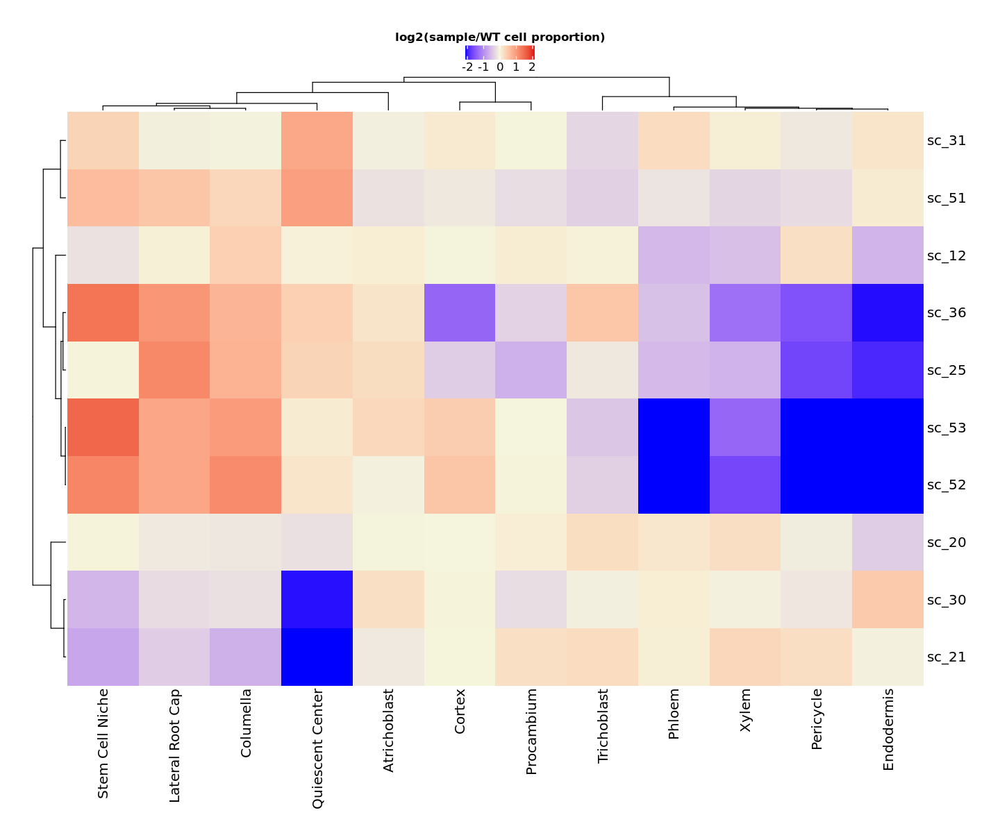

In [19]:
options(repr.plot.width=12, repr.plot.height=10)
# add to hm cell_fun = function(j, i, x, y, width, height, fill) {grid.text(sprintf("%.0f", int_matrix[i, j]), x, y, gp = gpar(fontsize = 10))})

Cell_hm <- Heatmap(cell_m, name = "log2(sample/WT cell proportion)", 
                   heatmap_legend_param = list(title_position="topcenter", 
                                               color_bar = "continuous", 
                                               legend_direction = "horizontal"), 
                   col = colorRamp2(c(-2, 0, 2), c("blue", "beige", "#e31a1c")), 
                   cluster_rows = T, 
                   cluster_columns = T, 
                   use_raster= FALSE, 
                   show_column_names = TRUE, show_row_names = TRUE, show_row_dend = TRUE, show_column_dend = TRUE,
                   clustering_distance_rows = "pearson", clustering_distance_columns = "pearson",
                 row_names_gp = gpar(fontsize = 12)) 


draw(Cell_hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [20]:
table(rc.integrated$batch)


batch 1 batch 2 batch 3 batch 4 
  10293   29985   24976   21006 

In [21]:
table(rc.integrated$batch, rc.integrated$orig.ident)

         
          sc_12 sc_20 sc_21 sc_25 sc_30 sc_31 sc_36 sc_51 sc_52 sc_53
  batch 1 10293     0     0     0     0     0     0     0     0     0
  batch 2     0 12591  9658  7736     0     0     0     0     0     0
  batch 3     0     0     0     0 10195  8775  6006     0     0     0
  batch 4     0     0     0     0     0     0     0  6394  6241  8371

In [22]:
rc.integrated$batch<- gsub(" ", "_", rc.integrated$batch, ignore.case = FALSE, perl = FALSE,
     fixed = T, useBytes = FALSE)
table(rc.integrated$batch, rc.integrated$orig.ident)

         
          sc_12 sc_20 sc_21 sc_25 sc_30 sc_31 sc_36 sc_51 sc_52 sc_53
  batch_1 10293     0     0     0     0     0     0     0     0     0
  batch_2     0 12591  9658  7736     0     0     0     0     0     0
  batch_3     0     0     0     0 10195  8775  6006     0     0     0
  batch_4     0     0     0     0     0     0     0  6394  6241  8371

## 3. shr DA analysis

In [23]:
# subset only samples you want to compare
integrated.de <- subset(rc.integrated, subset = geno_trt %in% c("WT", "shr"))

In [24]:
DefaultAssay(integrated.de) <- "RNA"
merged <- as.SingleCellExperiment(integrated.de)

In [25]:
merged

class: SingleCellExperiment 
dim: 28429 72518 
metadata(0):
assays(2): counts logcounts
rownames(28429): AT1G01010 AT1G01020 ... AT4G07645 AT4G29600
rowData names(0):
colnames(72518): AAACCCAAGCCATTCA_1 AAACCCAAGCTGTTCA_1 ...
  TTTGTTGTCCTTTGAT_10 TTTGTTGTCTCGCTTG_10
colData names(138): orig.ident nCount_RNA ... sample.cell.p ident
reducedDimNames(5): PCA UMAP UMAP_50 UMAP_3D UMAP_2D
spikeNames(0):
altExpNames(0):

In [26]:
abundances <- table(merged$celltype.anno, merged$orig.ident) 
abundances <- unclass(abundances) 
abundances

,sc_12,sc_20,sc_21,sc_30,sc_31,sc_51,sc_52,sc_53
Quiescent Center,48,50,7,12,71,55,32,41
Stem Cell Niche,65,91,42,49,80,70,101,167
Columella,1309,1116,608,866,829,771,1322,1566
Lateral Root Cap,1328,1446,935,1082,1046,1133,1383,1866
Atrichoblast,1351,1556,1120,1505,1052,705,762,1302
Trichoblast,1313,1865,1457,1222,902,633,619,780
Cortex,1146,1404,1081,1148,1066,663,1001,1264
Endodermis,664,947,916,1361,959,666,95,95
Pericycle,1159,1153,1100,895,777,524,135,183
Phloem,410,818,589,629,615,336,46,86


In [27]:
# Attaching some column metadata.
extra.info <- colData(merged)[match(colnames(abundances), merged$orig.ident),]
y.ab <- DGEList(abundances, samples=extra.info)
y.ab

,sc_12,sc_20,sc_21,sc_30,sc_31,sc_51,sc_52,sc_53
Quiescent Center,48,50,7,12,71,55,32,41
Stem Cell Niche,65,91,42,49,80,70,101,167
Columella,1309,1116,608,866,829,771,1322,1566
Lateral Root Cap,1328,1446,935,1082,1046,1133,1383,1866
Atrichoblast,1351,1556,1120,1505,1052,705,762,1302
Trichoblast,1313,1865,1457,1222,902,633,619,780
Cortex,1146,1404,1081,1148,1066,663,1001,1264
Endodermis,664,947,916,1361,959,666,95,95
Pericycle,1159,1153,1100,895,777,524,135,183
Phloem,410,818,589,629,615,336,46,86


In [28]:
keep <- filterByExpr(y.ab, group=y.ab$samples$orig.ident)
y.ab <- y.ab[keep,]
summary(keep)

   Mode    TRUE 
logical      12 

In [29]:
(design <- model.matrix(~batch + factor(geno_trt), y.ab$samples))

,(Intercept),batchbatch_2,batchbatch_3,batchbatch_4,factor(geno_trt)shr
sc_12,1,0,0,0,0
sc_20,1,1,0,0,0
sc_21,1,1,0,0,0
sc_30,1,0,1,0,0
sc_31,1,0,1,0,0
sc_51,1,0,0,1,0
sc_52,1,0,0,1,1
sc_53,1,0,0,1,1


In [30]:
y.ab <- estimateDisp(y.ab, design, trend="none")
summary(y.ab$common.dispersion)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.03795 0.03795 0.03795 0.03795 0.03795 0.03795 

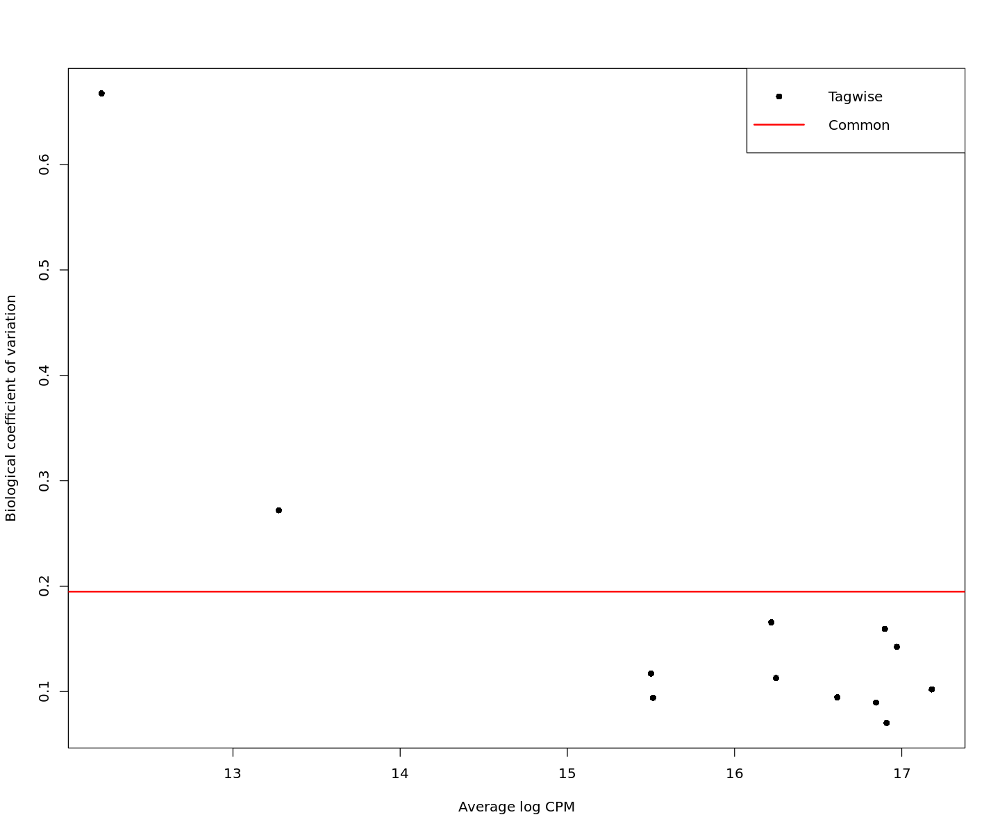

In [31]:
plotBCV(y.ab, cex=1)

In [32]:
fit.ab <- glmQLFit(y.ab, design, robust=TRUE, abundance.trend=FALSE)
summary(fit.ab$var.prior)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.3863  0.3863  0.3863  0.3863  0.3863  0.3863 

In [33]:
summary(fit.ab$df.prior)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.5547  3.9487  3.9487  3.5185  3.9487  3.9487 

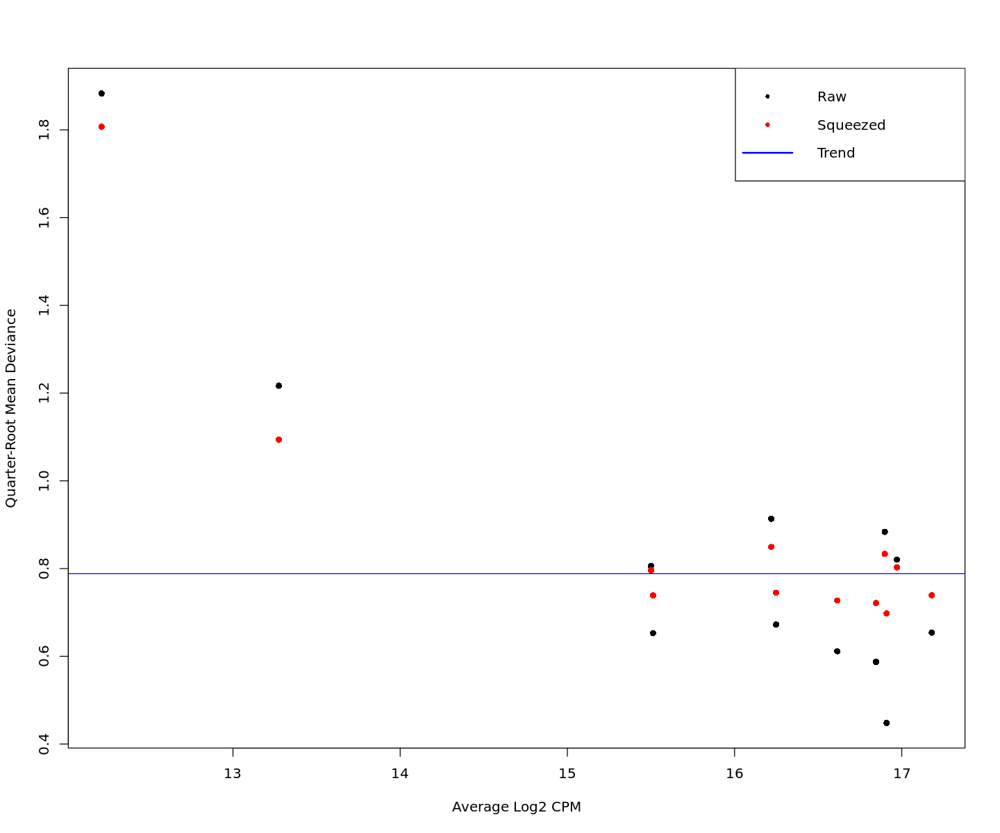

In [34]:
plotQLDisp(fit.ab, cex=1)

In [35]:
res <- glmQLFTest(fit.ab, coef=ncol(design))
summary(decideTests(res))

       factor(geno_trt)shr
Down                     4
NotSig                   6
Up                       2

In [36]:
topTags(res, n = nrow(res$table))

,logFC,logCPM,F,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-2.97627835,16.21968,137.35032335,7.883747e-06,6.462717e-05
Phloem,-2.56252095,15.50018,125.02344065,1.077120e-05,6.462717e-05
Pericycle,-1.91318216,16.24827,99.01296479,2.321556e-05,9.286225e-05
Xylem,-1.13601994,15.51238,34.44287381,6.357430e-04,1.907229e-03
Cortex,0.58621456,16.90957,11.29383702,1.220667e-02,2.929601e-02
Columella,0.72571103,16.89886,8.42638836,2.308058e-02,4.616116e-02
Lateral Root Cap,0.32685103,17.17964,2.88355577,1.336122e-01,2.290495e-01
Atrichoblast,0.33289090,16.97099,2.12491326,1.885834e-01,2.517830e-01
Stem Cell Niche,0.72566716,13.27439,2.28733527,1.888372e-01,2.517830e-01


In [37]:
shr_DA_results <- topTags(res, n = nrow(res$table))$table

In [38]:
shr_DA_results

,logFC,logCPM,F,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-2.97627835,16.21968,137.35032335,7.883747e-06,6.462717e-05
Phloem,-2.56252095,15.50018,125.02344065,1.077120e-05,6.462717e-05
Pericycle,-1.91318216,16.24827,99.01296479,2.321556e-05,9.286225e-05
Xylem,-1.13601994,15.51238,34.44287381,6.357430e-04,1.907229e-03
Cortex,0.58621456,16.90957,11.29383702,1.220667e-02,2.929601e-02
Columella,0.72571103,16.89886,8.42638836,2.308058e-02,4.616116e-02
Lateral Root Cap,0.32685103,17.17964,2.88355577,1.336122e-01,2.290495e-01
Atrichoblast,0.33289090,16.97099,2.12491326,1.885834e-01,2.517830e-01
Stem Cell Niche,0.72566716,13.27439,2.28733527,1.888372e-01,2.517830e-01


## 4. scr DA analysis

In [39]:
# subset only samples you want to compare
integrated.de <- subset(rc.integrated, subset = geno_trt %in% c("WT", "scr"))

DefaultAssay(integrated.de) <- "RNA"
merged <- as.SingleCellExperiment(integrated.de)

merged

class: SingleCellExperiment 
dim: 28429 71648 
metadata(0):
assays(2): counts logcounts
rownames(28429): AT1G01010 AT1G01020 ... AT4G07645 AT4G29600
rowData names(0):
colnames(71648): AAACCCAAGCCATTCA_1 AAACCCAAGCTGTTCA_1 ...
  TTTGTTGGTGGCTTGC_8 TTTGTTGTCTAAGCCA_8
colData names(138): orig.ident nCount_RNA ... sample.cell.p ident
reducedDimNames(5): PCA UMAP UMAP_50 UMAP_3D UMAP_2D
spikeNames(0):
altExpNames(0):

In [40]:
abundances <- table(merged$celltype.anno, merged$orig.ident) 
abundances <- unclass(abundances) 
abundances

# Attaching some column metadata.
extra.info <- colData(merged)[match(colnames(abundances), merged$orig.ident),]
y.ab <- DGEList(abundances, samples=extra.info)
y.ab

keep <- filterByExpr(y.ab, group=y.ab$samples$orig.ident)
y.ab <- y.ab[keep,]
summary(keep)

,sc_12,sc_20,sc_21,sc_25,sc_30,sc_31,sc_36,sc_51
Quiescent Center,48,50,7,45,12,71,36,55
Stem Cell Niche,65,91,42,56,49,80,110,70
Columella,1309,1116,608,1227,866,829,934,771
Lateral Root Cap,1328,1446,935,2134,1082,1046,1503,1133
Atrichoblast,1351,1556,1120,1156,1505,1052,853,705
Trichoblast,1313,1865,1457,890,1222,902,1061,633
Cortex,1146,1404,1081,673,1148,1066,273,663
Endodermis,664,947,916,211,1361,959,150,666
Pericycle,1159,1153,1100,247,895,777,206,524
Phloem,410,818,589,313,629,615,253,336


,sc_12,sc_20,sc_21,sc_25,sc_30,sc_31,sc_36,sc_51
Quiescent Center,48,50,7,45,12,71,36,55
Stem Cell Niche,65,91,42,56,49,80,110,70
Columella,1309,1116,608,1227,866,829,934,771
Lateral Root Cap,1328,1446,935,2134,1082,1046,1503,1133
Atrichoblast,1351,1556,1120,1156,1505,1052,853,705
Trichoblast,1313,1865,1457,890,1222,902,1061,633
Cortex,1146,1404,1081,673,1148,1066,273,663
Endodermis,664,947,916,211,1361,959,150,666
Pericycle,1159,1153,1100,247,895,777,206,524
Phloem,410,818,589,313,629,615,253,336


   Mode    TRUE 
logical      12 

In [41]:
(design <- model.matrix(~batch + factor(geno_trt), y.ab$samples))

,(Intercept),batchbatch_2,batchbatch_3,batchbatch_4,factor(geno_trt)scr
sc_12,1,0,0,0,0
sc_20,1,1,0,0,0
sc_21,1,1,0,0,0
sc_25,1,1,0,0,1
sc_30,1,0,1,0,0
sc_31,1,0,1,0,0
sc_36,1,0,1,0,1
sc_51,1,0,0,1,0


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.06526 0.06526 0.06526 0.06526 0.06526 0.06526 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.4215  0.4215  0.4215  0.4215  0.4215  0.4215 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.9332  3.6505  3.6505  3.3338  3.6505  3.6505 

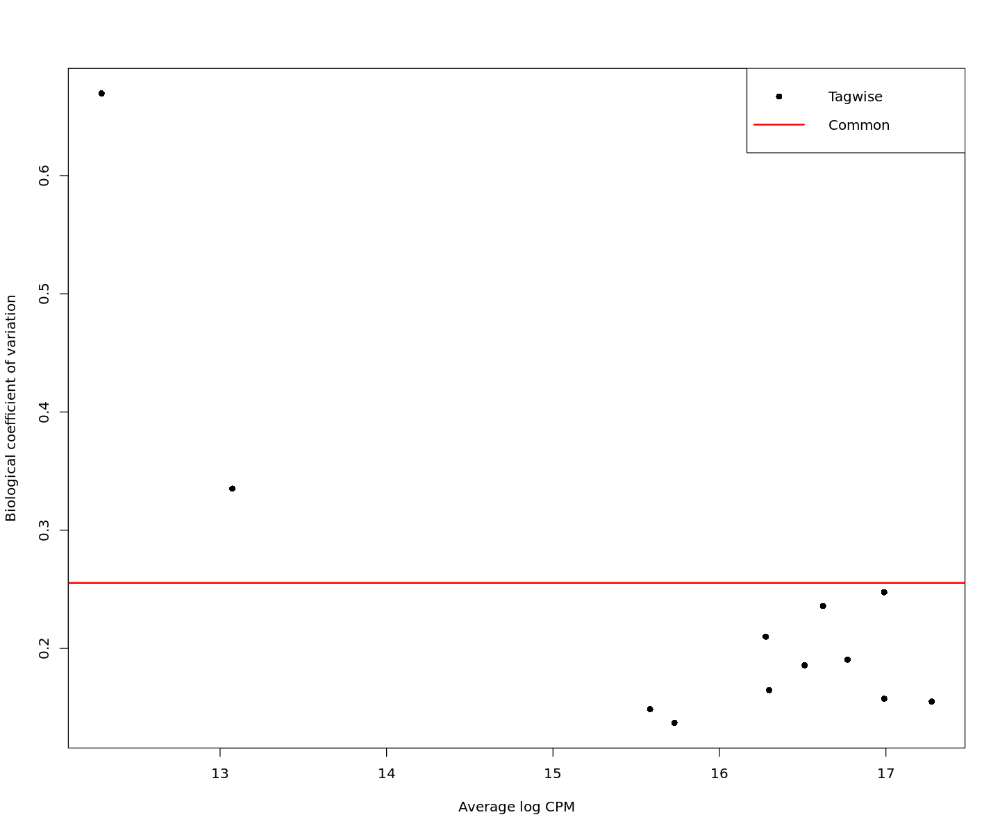

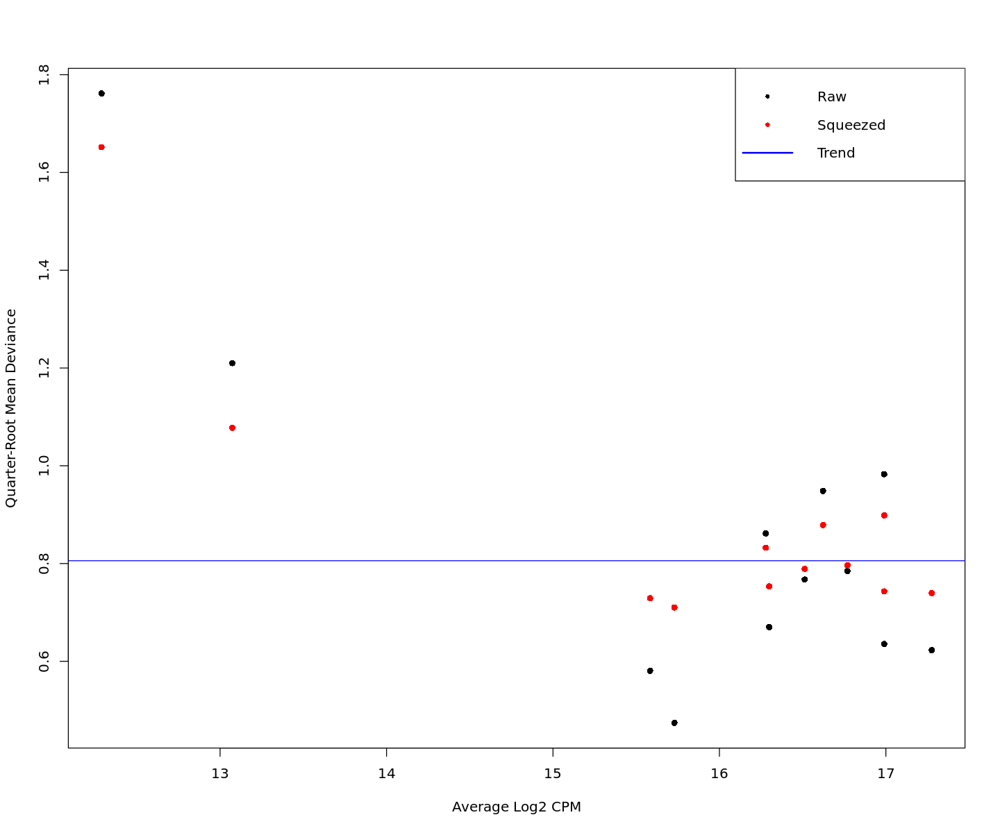

In [42]:
y.ab <- estimateDisp(y.ab, design, trend="none")
summary(y.ab$common.dispersion)

plotBCV(y.ab, cex=1)

fit.ab <- glmQLFit(y.ab, design, robust=TRUE, abundance.trend=FALSE)
summary(fit.ab$var.prior)

summary(fit.ab$df.prior)

plotQLDisp(fit.ab, cex=1)

In [43]:
res <- glmQLFTest(fit.ab, coef=ncol(design))
summary(decideTests(res))

topTags(res, n = nrow(res$table))

(scr_DA_results <- topTags(res, n = nrow(res$table))$table)

       factor(geno_trt)scr
Down                     5
NotSig                   5
Up                       2

,logFC,logCPM,F,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-1.9468399,16.27837,60.9240135,0.0001390260,0.0007259634
Pericycle,-1.5215188,16.29875,58.6074862,0.0001563536,0.0007259634
Lateral Root Cap,1.2682254,17.27582,55.7827674,0.0001814908,0.0007259634
Xylem,-1.0483704,15.58333,33.0151090,0.0008423143,0.0025269429
Columella,0.9313863,16.76929,21.9645241,0.0025707731,0.0061698554
Phloem,-0.6416585,15.72943,14.4819308,0.0073399770,0.0146799540
Cortex,-0.8295243,16.62221,10.0665144,0.0167526478,0.0287188247
Procambium,-0.4813346,16.51235,5.4608344,0.0539702677,0.0809554015
Stem Cell Niche,0.8983625,13.07362,4.9646074,0.0708912608,0.0945216811


,logFC,logCPM,F,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-1.9468399,16.27837,60.9240135,0.0001390260,0.0007259634
Pericycle,-1.5215188,16.29875,58.6074862,0.0001563536,0.0007259634
Lateral Root Cap,1.2682254,17.27582,55.7827674,0.0001814908,0.0007259634
Xylem,-1.0483704,15.58333,33.0151090,0.0008423143,0.0025269429
Columella,0.9313863,16.76929,21.9645241,0.0025707731,0.0061698554
Phloem,-0.6416585,15.72943,14.4819308,0.0073399770,0.0146799540
Cortex,-0.8295243,16.62221,10.0665144,0.0167526478,0.0287188247
Procambium,-0.4813346,16.51235,5.4608344,0.0539702677,0.0809554015
Stem Cell Niche,0.8983625,13.07362,4.9646074,0.0708912608,0.0945216811


In [44]:
y.ab2 <- calcNormFactors(y.ab)
y.ab2$samples$norm.factors

y.ab2 <- estimateDisp(y.ab2, design, trend="none")
fit.ab2 <- glmQLFit(y.ab2, design, robust=TRUE, abundance.trend=FALSE)
res2 <- glmQLFTest(fit.ab2, coef=ncol(design))
summary(decideTests(res2))
topTags(res, n = nrow(res$table))$table

(scr_DA_results_adj <- topTags(res, n = nrow(res$table))$table)

[1] 0.9382821 1.0709256 1.0763701 0.9005683 1.0203479 1.1256268 0.8809392
[8] 1.0147063

       factor(geno_trt)scr
Down                     3
NotSig                   7
Up                       2

,logFC,logCPM,F,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-1.9468399,16.27837,60.9240135,0.0001390260,0.0007259634
Pericycle,-1.5215188,16.29875,58.6074862,0.0001563536,0.0007259634
Lateral Root Cap,1.2682254,17.27582,55.7827674,0.0001814908,0.0007259634
Xylem,-1.0483704,15.58333,33.0151090,0.0008423143,0.0025269429
Columella,0.9313863,16.76929,21.9645241,0.0025707731,0.0061698554
Phloem,-0.6416585,15.72943,14.4819308,0.0073399770,0.0146799540
Cortex,-0.8295243,16.62221,10.0665144,0.0167526478,0.0287188247
Procambium,-0.4813346,16.51235,5.4608344,0.0539702677,0.0809554015
Stem Cell Niche,0.8983625,13.07362,4.9646074,0.0708912608,0.0945216811


,logFC,logCPM,F,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-1.9468399,16.27837,60.9240135,0.0001390260,0.0007259634
Pericycle,-1.5215188,16.29875,58.6074862,0.0001563536,0.0007259634
Lateral Root Cap,1.2682254,17.27582,55.7827674,0.0001814908,0.0007259634
Xylem,-1.0483704,15.58333,33.0151090,0.0008423143,0.0025269429
Columella,0.9313863,16.76929,21.9645241,0.0025707731,0.0061698554
Phloem,-0.6416585,15.72943,14.4819308,0.0073399770,0.0146799540
Cortex,-0.8295243,16.62221,10.0665144,0.0167526478,0.0287188247
Procambium,-0.4813346,16.51235,5.4608344,0.0539702677,0.0809554015
Stem Cell Niche,0.8983625,13.07362,4.9646074,0.0708912608,0.0945216811


## 5. Combine shr and scr DA results to plot

In [45]:
(shr_DA_results <- rownames_to_column(shr_DA_results, var = "celltype"))

shr_DA_results$geno <- rep("shr")

(scr_DA_results <- rownames_to_column(scr_DA_results, var = "celltype"))

scr_DA_results$geno <- rep("scr")

(DA_results <- bind_rows(shr_DA_results, scr_DA_results))

(DA_results <- mutate(DA_results, star = case_when(FDR <=0.001 ~ "***",  
                                          FDR <=0.01 ~ "**", 
                                          FDR <=0.05 ~ "*", 
                                          TRUE ~ " ")))

celltype,logFC,logCPM,F,PValue,FDR
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-2.97627835,16.21968,137.35032335,7.883747e-06,6.462717e-05
Phloem,-2.56252095,15.50018,125.02344065,1.077120e-05,6.462717e-05
Pericycle,-1.91318216,16.24827,99.01296479,2.321556e-05,9.286225e-05
Xylem,-1.13601994,15.51238,34.44287381,6.357430e-04,1.907229e-03
Cortex,0.58621456,16.90957,11.29383702,1.220667e-02,2.929601e-02
Columella,0.72571103,16.89886,8.42638836,2.308058e-02,4.616116e-02
Lateral Root Cap,0.32685103,17.17964,2.88355577,1.336122e-01,2.290495e-01
Atrichoblast,0.33289090,16.97099,2.12491326,1.885834e-01,2.517830e-01
Stem Cell Niche,0.72566716,13.27439,2.28733527,1.888372e-01,2.517830e-01


celltype,logFC,logCPM,F,PValue,FDR
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endodermis,-1.9468399,16.27837,60.9240135,0.0001390260,0.0007259634
Pericycle,-1.5215188,16.29875,58.6074862,0.0001563536,0.0007259634
Lateral Root Cap,1.2682254,17.27582,55.7827674,0.0001814908,0.0007259634
Xylem,-1.0483704,15.58333,33.0151090,0.0008423143,0.0025269429
Columella,0.9313863,16.76929,21.9645241,0.0025707731,0.0061698554
Phloem,-0.6416585,15.72943,14.4819308,0.0073399770,0.0146799540
Cortex,-0.8295243,16.62221,10.0665144,0.0167526478,0.0287188247
Procambium,-0.4813346,16.51235,5.4608344,0.0539702677,0.0809554015
Stem Cell Niche,0.8983625,13.07362,4.9646074,0.0708912608,0.0945216811


celltype,logFC,logCPM,F,PValue,FDR,geno
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Endodermis,-2.97627835,16.21968,137.35032335,7.883747e-06,6.462717e-05,shr
Phloem,-2.56252095,15.50018,125.02344065,1.077120e-05,6.462717e-05,shr
Pericycle,-1.91318216,16.24827,99.01296479,2.321556e-05,9.286225e-05,shr
Xylem,-1.13601994,15.51238,34.44287381,6.357430e-04,1.907229e-03,shr
Cortex,0.58621456,16.90957,11.29383702,1.220667e-02,2.929601e-02,shr
Columella,0.72571103,16.89886,8.42638836,2.308058e-02,4.616116e-02,shr
Lateral Root Cap,0.32685103,17.17964,2.88355577,1.336122e-01,2.290495e-01,shr
Atrichoblast,0.33289090,16.97099,2.12491326,1.885834e-01,2.517830e-01,shr
Stem Cell Niche,0.72566716,13.27439,2.28733527,1.888372e-01,2.517830e-01,shr


celltype,logFC,logCPM,F,PValue,FDR,geno,star
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Endodermis,-2.97627835,16.21968,137.35032335,7.883747e-06,6.462717e-05,shr,***
Phloem,-2.56252095,15.50018,125.02344065,1.077120e-05,6.462717e-05,shr,***
Pericycle,-1.91318216,16.24827,99.01296479,2.321556e-05,9.286225e-05,shr,***
Xylem,-1.13601994,15.51238,34.44287381,6.357430e-04,1.907229e-03,shr,**
Cortex,0.58621456,16.90957,11.29383702,1.220667e-02,2.929601e-02,shr,*
Columella,0.72571103,16.89886,8.42638836,2.308058e-02,4.616116e-02,shr,*
Lateral Root Cap,0.32685103,17.17964,2.88355577,1.336122e-01,2.290495e-01,shr,
Atrichoblast,0.33289090,16.97099,2.12491326,1.885834e-01,2.517830e-01,shr,
Stem Cell Niche,0.72566716,13.27439,2.28733527,1.888372e-01,2.517830e-01,shr,


In [46]:
DA_results

celltype,logFC,logCPM,F,PValue,FDR,geno,star
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Endodermis,-2.97627835,16.21968,137.35032335,7.883747e-06,6.462717e-05,shr,***
Phloem,-2.56252095,15.50018,125.02344065,1.077120e-05,6.462717e-05,shr,***
Pericycle,-1.91318216,16.24827,99.01296479,2.321556e-05,9.286225e-05,shr,***
Xylem,-1.13601994,15.51238,34.44287381,6.357430e-04,1.907229e-03,shr,**
Cortex,0.58621456,16.90957,11.29383702,1.220667e-02,2.929601e-02,shr,*
Columella,0.72571103,16.89886,8.42638836,2.308058e-02,4.616116e-02,shr,*
Lateral Root Cap,0.32685103,17.17964,2.88355577,1.336122e-01,2.290495e-01,shr,
Atrichoblast,0.33289090,16.97099,2.12491326,1.885834e-01,2.517830e-01,shr,
Stem Cell Niche,0.72566716,13.27439,2.28733527,1.888372e-01,2.517830e-01,shr,


In [47]:
write.csv(DA_results, "./supp_data/shr_scr_DA_celltype.csv", row.names=F)

In [48]:
FC_wide <- select(DA_results, geno, , celltype, logFC) %>%
  pivot_wider(names_from = geno, values_from = logFC) %>% mutate(WT=rep(0))

FC_wide_m <- as.matrix(FC_wide[, 2:ncol(FC_wide)])
rownames(FC_wide_m) <- FC_wide$celltype

FC_wide_m

star.wide <- select(DA_results, geno, , celltype, star) %>%
  pivot_wider(names_from = geno, values_from = star) %>%
mutate(WT=rep(" "))

star.wide[is.na(star.wide)] <- " "

star.wide_m <- as.matrix(star.wide[, 2:ncol(star.wide)])
rownames(star.wide_m) <- star.wide$celltype
FC_wide_m
star.wide_m


,shr,scr,WT
Endodermis,-2.97627835,-1.9468399,0
Phloem,-2.56252095,-0.6416585,0
Pericycle,-1.91318216,-1.5215188,0
Xylem,-1.13601994,-1.0483704,0
Cortex,0.58621456,-0.8295243,0
Columella,0.72571103,0.9313863,0
Lateral Root Cap,0.32685103,1.2682254,0
Atrichoblast,0.33289090,0.2044612,0
Stem Cell Niche,0.72566716,0.8983625,0
Procambium,0.22048350,-0.4813346,0


,shr,scr,WT
Endodermis,-2.97627835,-1.9468399,0
Phloem,-2.56252095,-0.6416585,0
Pericycle,-1.91318216,-1.5215188,0
Xylem,-1.13601994,-1.0483704,0
Cortex,0.58621456,-0.8295243,0
Columella,0.72571103,0.9313863,0
Lateral Root Cap,0.32685103,1.2682254,0
Atrichoblast,0.33289090,0.2044612,0
Stem Cell Niche,0.72566716,0.8983625,0
Procambium,0.22048350,-0.4813346,0


,shr,scr,WT
Endodermis,***,***,
Phloem,***,*,
Pericycle,***,***,
Xylem,**,**,
Cortex,*,*,
Columella,*,**,
Lateral Root Cap,,***,
Atrichoblast,,,
Stem Cell Niche,,,
Procambium,,,


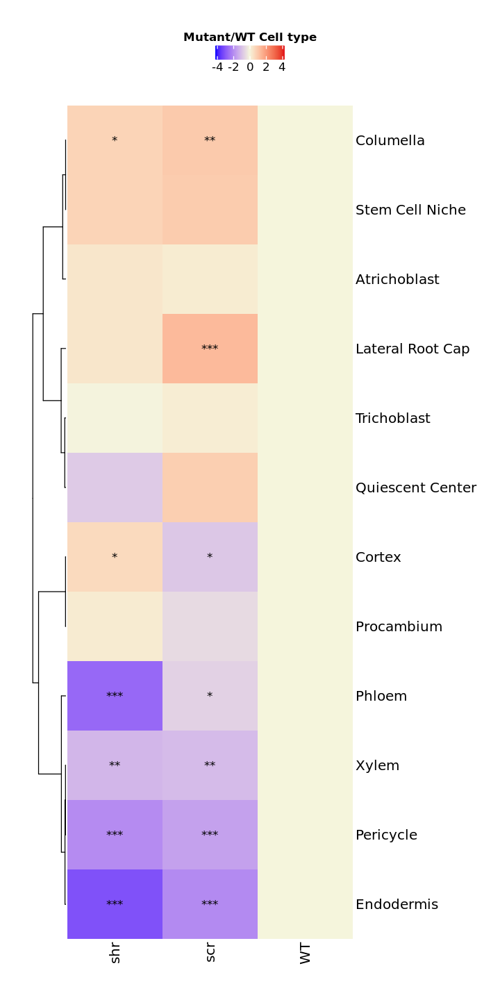

In [49]:
options(repr.plot.width=6, repr.plot.height=12)

vert_Cell_hm <- Heatmap(FC_wide_m, 
                name = "Mutant/WT Cell type", 
                col = colorRamp2(c(-4, 0, 4), c("blue", "beige", "#e31a1c")), 
                column_title = " ", 
                cluster_rows = T,
                cluster_columns = F, 
                clustering_distance_columns = "pearson", 
                clustering_distance_rows = "pearson",
                use_raster= FALSE, 
                show_column_names = TRUE, 
                show_row_names = TRUE, 
                show_row_dend = TRUE, 
                show_column_dend = TRUE, 
                        heatmap_legend_param = list(title_position="topcenter", 
                                               color_bar = "continuous", 
                                               legend_direction = "horizontal"), 
                cell_fun = function(j, i, x, y, width, height, fill) 
                  {grid.text(sprintf("%s", star.wide_m[i, j]), x, y, gp = gpar(fontsize = 10))}) 

draw(vert_Cell_hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

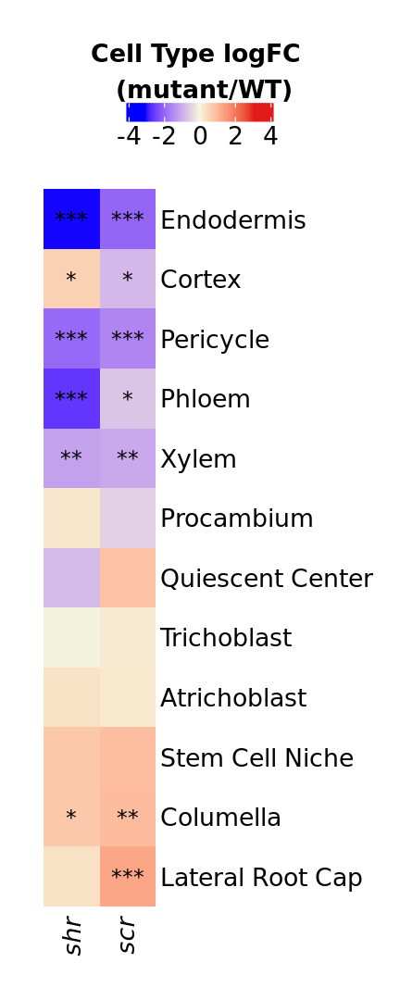

In [50]:
options(repr.plot.width=3.6, repr.plot.height=9)
	



FC_wide_m_2 <- FC_wide_m[c("Endodermis", 
                           "Cortex", 
                           "Pericycle", 
                           "Phloem", 
                           "Xylem",  
                           "Procambium", 
                           "Quiescent Center", 
                           "Trichoblast", 
                           "Atrichoblast", 
                           "Stem Cell Niche", 
                           "Columella", 
                           "Lateral Root Cap") , 
                         c("shr", "scr")]

star.wide_m_2 <- star.wide_m[c("Endodermis", 
                           "Cortex", 
                           "Pericycle", 
                           "Phloem", 
                           "Xylem",  
                           "Procambium", 
                               "Quiescent Center", 
                           "Trichoblast", 
                           "Atrichoblast", 
                            "Stem Cell Niche", 
                           "Columella", 
                           "Lateral Root Cap") , 
                         c("shr", "scr")]

col_lab_it <- c( 
              expression(italic("shr ")),
                expression(italic("scr ")))

vert_Cell_hm2 <- Heatmap(FC_wide_m_2, 
                name = "Cell Type logFC \n (mutant/WT)", 
                col = colorRamp2(c(-3, 0, 3), c("blue", "beige", "#e31a1c")), 
                column_title = " ", 
                cluster_rows = F,
                cluster_columns = F, 
                clustering_distance_columns = "pearson", 
                clustering_distance_rows = "pearson",
                use_raster= FALSE, 
                show_column_names = TRUE, 
                show_row_names = TRUE, 
                show_row_dend = TRUE, 
                show_column_dend = TRUE, 
                         column_labels=col_lab_it,
                         column_names_gp = gpar(fontsize = 16),
                         row_names_gp = gpar(fontsize = 16),
                        heatmap_legend_param = list(title_position="topcenter", 
                                               color_bar = "continuous", 
                                               legend_direction = "horizontal", 
                                                   labels_gp = gpar(fontsize = 16), 
                                                   title_gp = gpar(fontsize = 16, font = 2), 
                                                   legend_height = unit(4, "cm")), 
                cell_fun = function(j, i, x, y, width, height, fill) 
                  {grid.text(sprintf("%s", star.wide_m_2[i, j]), x, y, gp = gpar(fontsize = 14))}) 

draw(vert_Cell_hm2, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")


hm_final <- grid.grabExpr(draw(vert_Cell_hm2, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top"))

In [51]:
FC_wide_m_2 <- t(FC_wide_m_2)
rownames(FC_wide_m_2) <- c("shr-2", "scr-4")
star.wide_m_2 <- t(star.wide_m_2)
rownames(star.wide_m_2) <- c("shr-2", "scr-4")

In [52]:
FC_wide_m_2
star.wide_m_2

,Endodermis,Cortex,Pericycle,Phloem,Xylem,Procambium,Quiescent Center,Trichoblast,Atrichoblast,Stem Cell Niche,Columella,Lateral Root Cap
shr-2,-2.976278,0.5862146,-1.913182,-2.5625210,-1.13602,0.2204835,-0.7794572,-0.04190185,0.3328909,0.7256672,0.7257110,0.326851
scr-4,-1.946840,-0.8295243,-1.521519,-0.6416585,-1.04837,-0.4813346,0.8337638,0.17490457,0.2044612,0.8983625,0.9313863,1.268225


,Endodermis,Cortex,Pericycle,Phloem,Xylem,Procambium,Quiescent Center,Trichoblast,Atrichoblast,Stem Cell Niche,Columella,Lateral Root Cap
shr-2,***,*,***,***,**,,,,,,*,
scr-4,***,*,***,*,**,,,,,,**,***


png 
  2

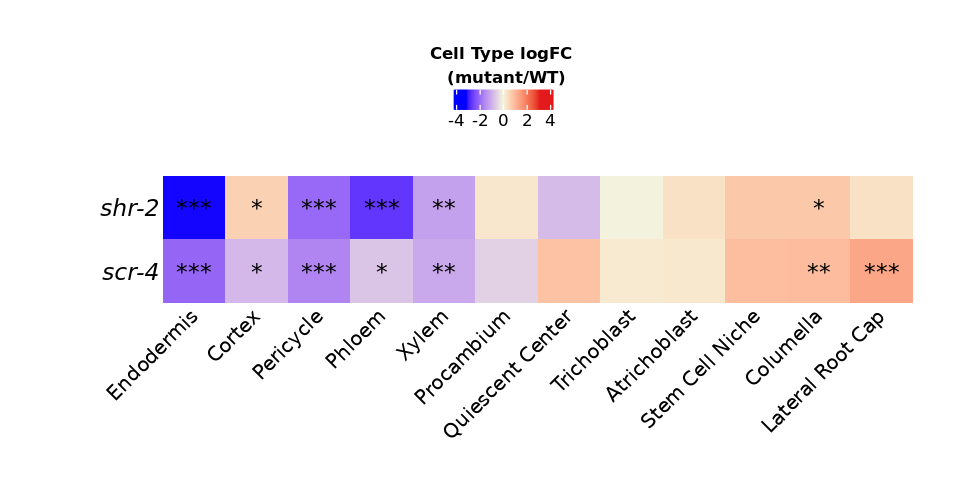

In [53]:
options(repr.plot.width=8, repr.plot.height=4)

hor_Cell_hm2 <- Heatmap(FC_wide_m_2, 
                name = "Cell Type logFC \n (mutant/WT)", 
                col = colorRamp2(c(-3, 0, 3), c("blue", "beige", "#e31a1c")), 
                column_title = " ", 
                cluster_rows = F,
                cluster_columns = F, 
                clustering_distance_columns = "pearson", 
                clustering_distance_rows = "pearson",
                use_raster= FALSE, 
                show_column_names = TRUE, 
                show_row_names = TRUE, 
                show_row_dend = TRUE, 
                        row_names_side = "left",
                show_column_dend = TRUE, 
                        column_names_rot = 45,
                        heatmap_legend_param = list(title_position="topcenter", 
                                               color_bar = "continuous", 
                                               legend_direction = "horizontal"), 
                        row_names_gp = gpar(fontsize = 14, font = 3),
                cell_fun = function(j, i, x, y, width, height, fill) 
                  {grid.text(sprintf("%s", star.wide_m_2[i, j]), x, y, gp = gpar(fontsize = 14))}) 

draw(hor_Cell_hm2, padding = unit(c(10, 20, 10, 10), "mm"), heatmap_legend_side = "top")

pdf("./supp_data/shr_scr_horizontal_DA.pdf", width = 8, height = 4)
draw(hor_Cell_hm2, padding = unit(c(10, 20, 10, 10), "mm"), heatmap_legend_side = "top")
dev.off()



## 6. Label transfer classification/prediction score

In [54]:
anno_scores <- data.frame(geno=rc.integrated$geno_trt, 
           prediction.score.Endodermis=rc.integrated$prediction.score.Endodermis, 
           prediction.score.Cortex=rc.integrated$prediction.score.Cortex, 
           annotation=rc.integrated$celltype.anno, 
                         timezone=rc.integrated$time.anno, 
                         consensus.time=rc.integrated$consensus.time.group)

In [55]:
anno_scores %>% filter(annotation %in% c("Cortex", "Endodermis")) %>% filter(is.na(prediction.score.Cortex)==F)

geno,prediction.score.Endodermis,prediction.score.Cortex,annotation,timezone,consensus.time
<fct>,<dbl>,<dbl>,<fct>,<fct>,<fct>
WT,0.00000000,1.00000000,Cortex,Elongation,T6
WT,0.00000000,1.00000000,Cortex,Elongation,T6
WT,1.00000000,0.00000000,Endodermis,Elongation,T4
WT,1.00000000,0.00000000,Endodermis,Maturation,T6
WT,0.01716984,0.98283016,Cortex,Maturation,T7
WT,0.00000000,1.00000000,Cortex,Maturation,T9
WT,1.00000000,0.00000000,Endodermis,Meristem,T1
WT,0.00000000,1.00000000,Cortex,Elongation,T9
WT,0.83207082,0.06699925,Endodermis,Meristem,T2


In [56]:
pred_plot <- anno_scores %>% filter(annotation %in% c("Cortex", "Endodermis")) %>% filter(is.na(prediction.score.Cortex)==F) %>%
ggplot(aes(x=prediction.score.Endodermis, y=prediction.score.Cortex, color=annotation)) + geom_point(alpha=0.1)

In [57]:
library(ggridges)

Picking joint bandwidth of 0.102



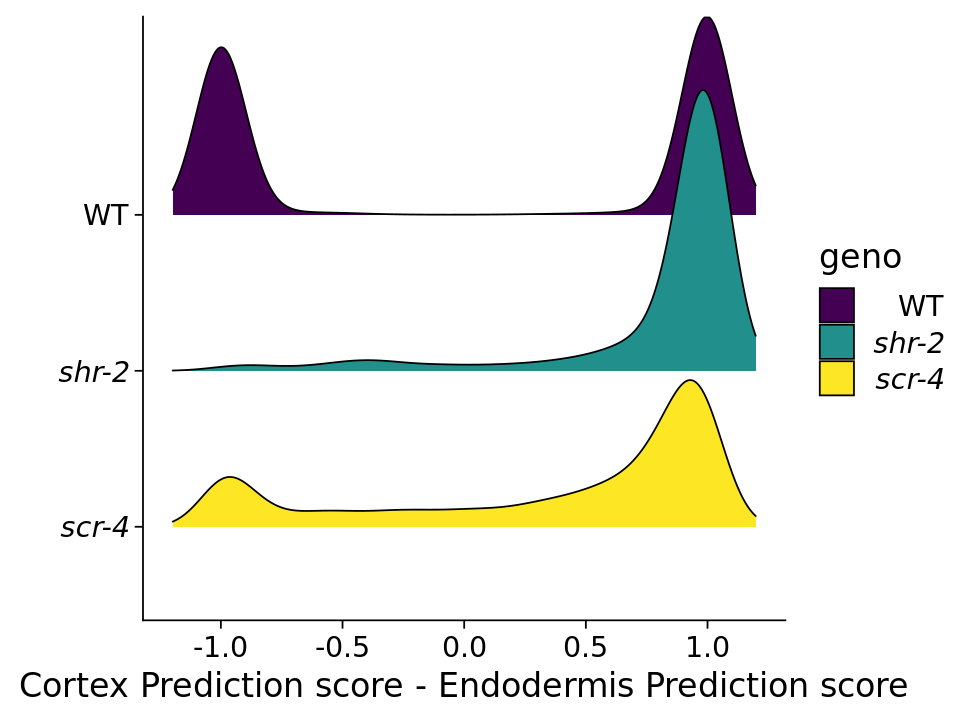

In [58]:
options(repr.plot.width=8, repr.plot.height=6)
pred_plot <- anno_scores %>% filter(annotation %in% c("Cortex", "Endodermis")) %>% filter(is.na(prediction.score.Cortex)==F) %>% 
mutate(Endodermis_Cortex_diff=prediction.score.Cortex-prediction.score.Endodermis)  %>%
ggplot(aes(y=factor(geno, levels=c("scr", "shr", "WT")), x=Endodermis_Cortex_diff, fill=geno)) + geom_density_ridges(rel_min_height = 0.00) 

mylabels <- c( 
              expression(italic("scr-4")),
                expression(italic("shr-2")), "WT")

pred_plot <- pred_plot + 
theme_cowplot(font_size = 20) + 
xlab("Cortex Prediction score - Endodermis Prediction score") + 
ylab("") + 
scale_fill_viridis_d(labels = rev(mylabels)) + 
scale_x_continuous(limits=c(-1.2, 1.2)) + 
scale_y_discrete(labels = mylabels)
pred_plot

Picking joint bandwidth of 0.13

Picking joint bandwidth of 0.0907

Picking joint bandwidth of 0.0809



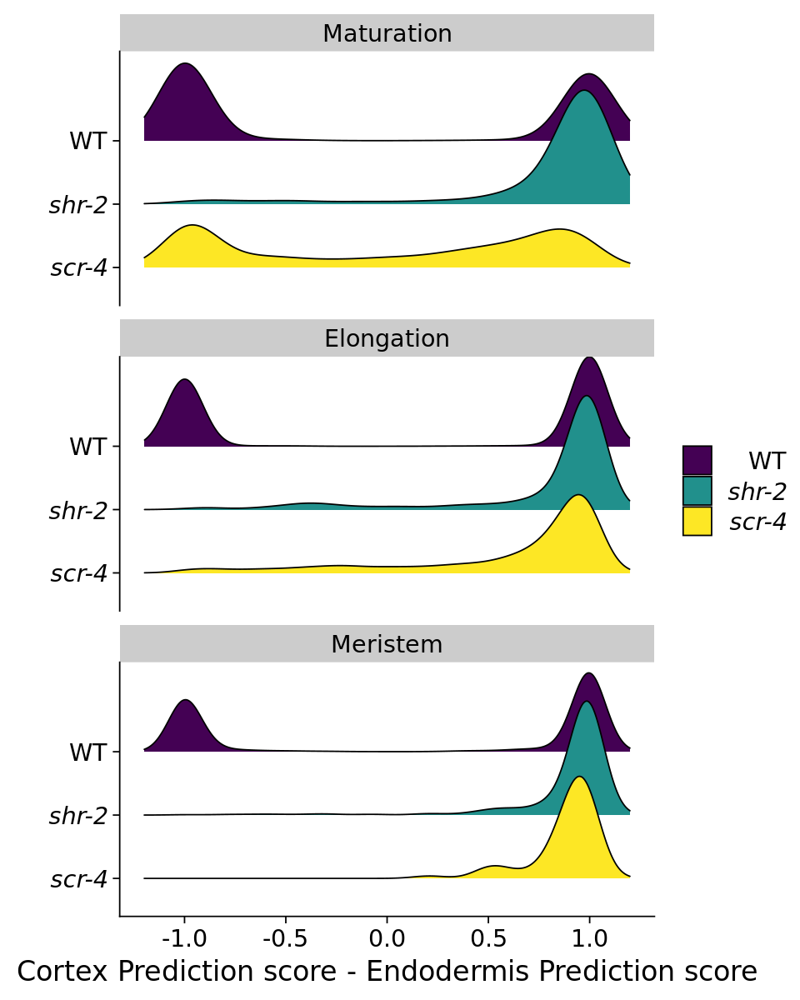

In [59]:
options(repr.plot.width=8, repr.plot.height=10)
pred_plot <- pred_plot + facet_wrap(~ factor(timezone, levels=c("Maturation","Elongation","Meristem")), ncol = 1) + theme(legend.title = element_blank())
pred_plot

x,y,t
<dbl>,<dbl>,<fct>
1,1.0,a
1,2.0,a
16,1.5,a
16,1.7,b
16,2.7,b
1,2.2,b


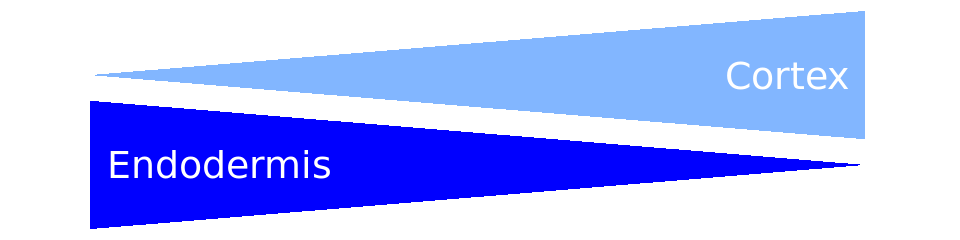

In [60]:
# make triangles 
options(repr.plot.width=8, repr.plot.height=2)

d=data.frame(x=c(1,1,16, 16,16,1), y=c(1,2,1.5, 1.7,2.7,2.2), t=c('a', 'a', 'a', 'b', 'b', 'b'))
d
triangle_label <- ggplot() +
geom_polygon(data=d, mapping=aes(x=x, y=y, group=t, fill=t)) + annotate("text", x = 3.5, y = 1.5, label = "Endodermis", size = 8, color="white") + 
annotate("text", x = 14.5, y = 2.2, label = "Cortex", size = 8, color="white") + 
scale_fill_manual(values=(c("#0000FF", "#82B6FF"))) + theme_nothing() + scale_x_continuous(limits=c(0.1, 17))

triangle_label

Picking joint bandwidth of 0.13

Picking joint bandwidth of 0.0907

Picking joint bandwidth of 0.0809



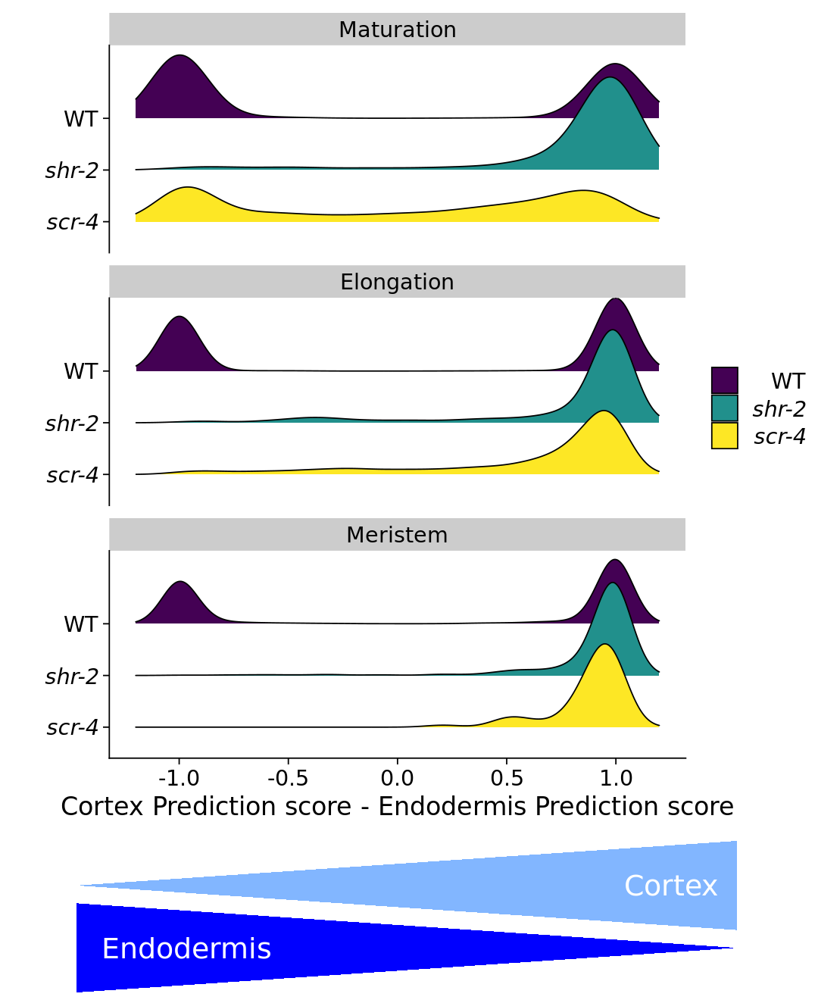

In [61]:
options(repr.plot.width=9, repr.plot.height=11)

(pred_tri <- plot_grid(pred_plot, triangle_label, ncol=1, rel_heights = c(1, .2)))

ggsave("./supp_data/WT_shr_scr_prediction_ridgeplot.pdf", width=9, height=10)

ggsave("./supp_data/WT_shr_scr_prediction_ridgeplot_taller.pdf", width=9, height=11)

ggsave("./supp_data/WT_shr_scr_prediction_ridgeplot_tallest.pdf", width=9, height=12)

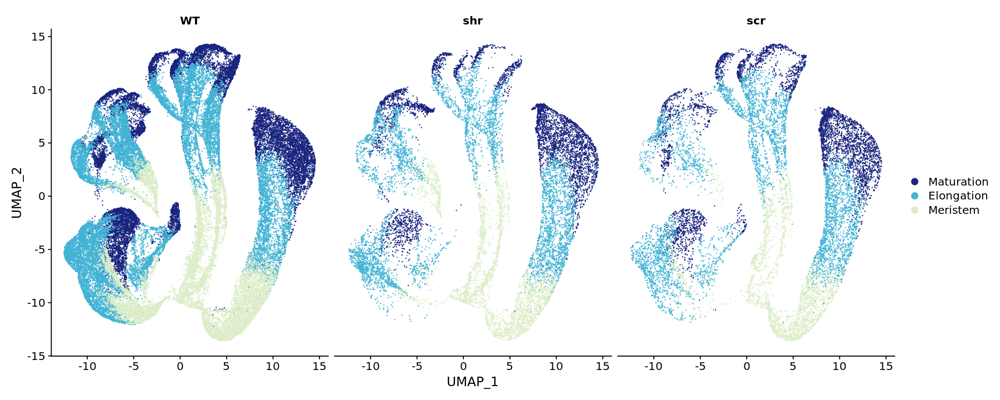

In [62]:

options(repr.plot.width=15, repr.plot.height=6)
time_plt <- DimPlot(rc.integrated, 
        group.by = "time.anno", 
        order = c("Meristem","Elongation","Maturation"),
        cols = c("#1A237E", "#42B3D5", "#DCEDC8"), split.by="geno_trt")
time_plt 



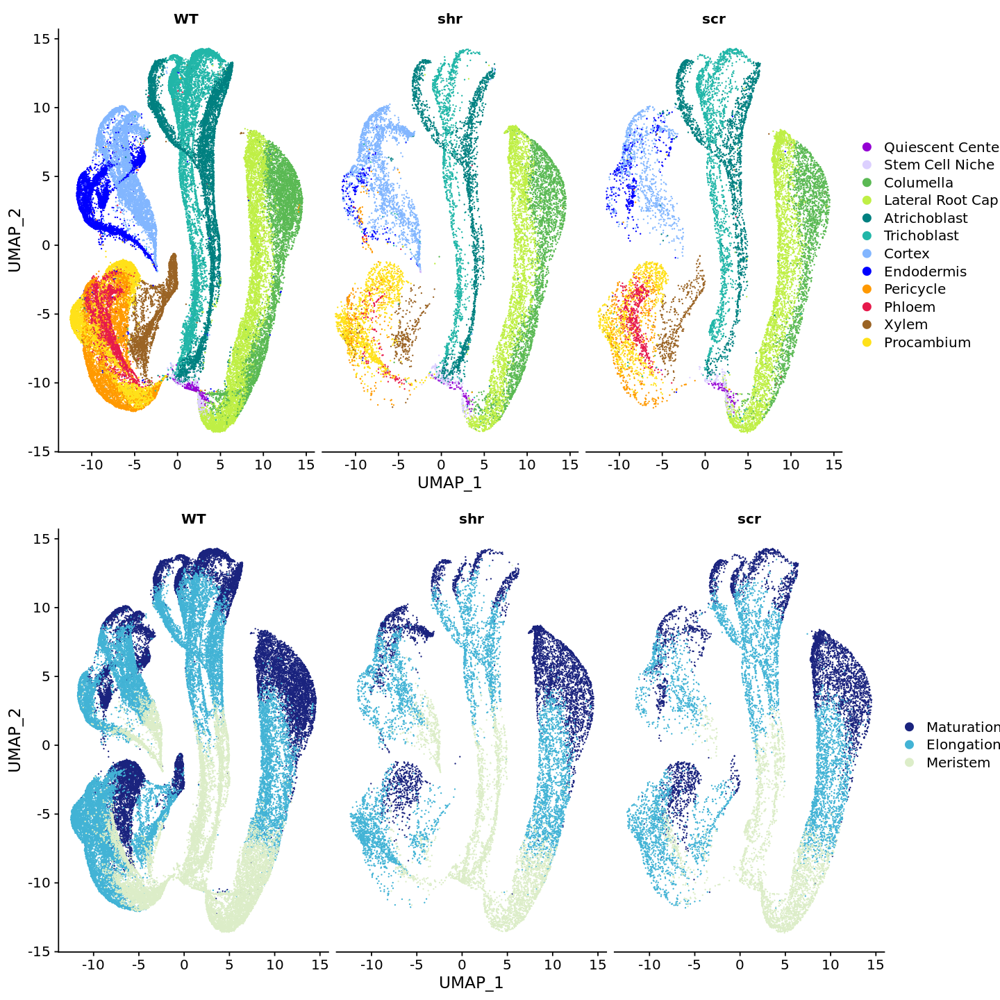

In [63]:
options(repr.plot.width=12, repr.plot.height=12)

cell_plt <- DimPlot(rc.integrated, reduction = "umap", group.by = "celltype.anno", split.by="geno_trt", cols=color)


(cell_time_plt <- plot_grid(cell_plt, time_plt, nrow=2))

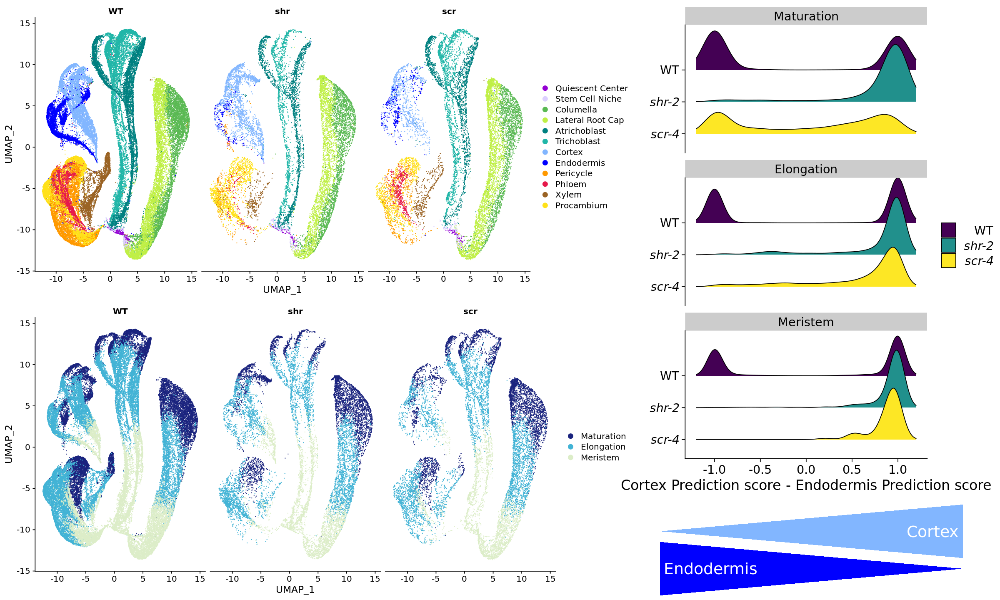

In [64]:
options(repr.plot.width=20, repr.plot.height=12)

plot_grid(cell_time_plt, pred_tri, ncol=2, rel_widths = c(2,1.2))

In [65]:
# swtich direction 

Picking joint bandwidth of 0.102



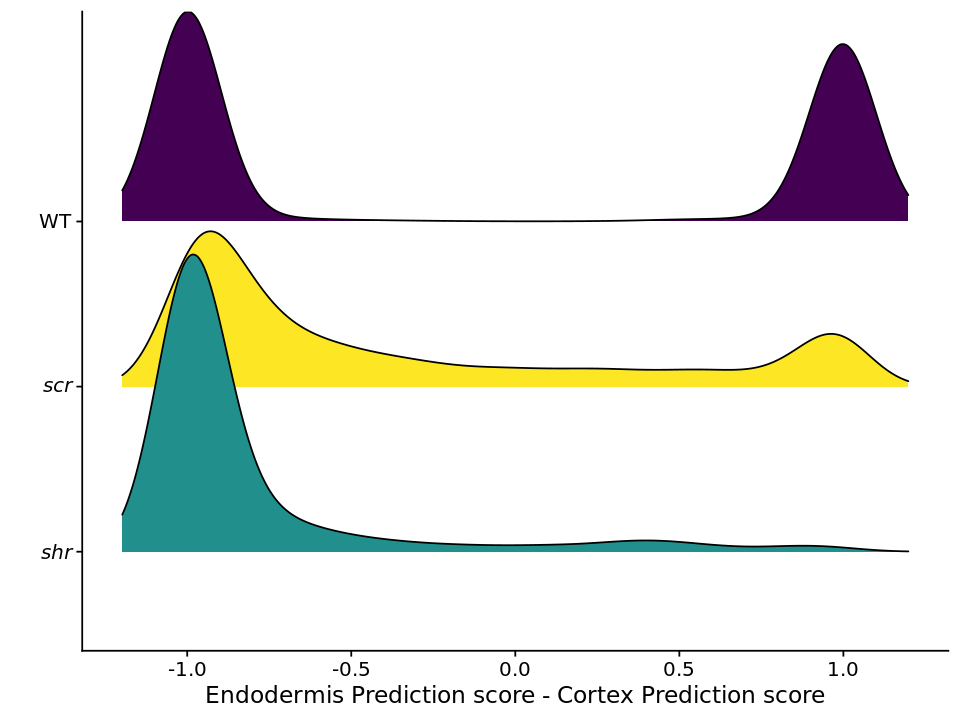

In [66]:
options(repr.plot.width=8, repr.plot.height=6)
pred_plot <- anno_scores %>% filter(annotation %in% c("Cortex", "Endodermis")) %>% filter(is.na(prediction.score.Cortex)==F) %>% 
mutate(Cortex__Endo_diff=prediction.score.Endodermis-prediction.score.Cortex)  %>%
ggplot(aes(y=factor(geno, levels=c("shr", "scr", "WT")), x=Cortex__Endo_diff, fill=geno)) + geom_density_ridges(rel_min_height = 0.00) 

mylabels <- c( 
              expression(italic("shr")),
                expression(italic("scr")), "WT")

pred_plot <- pred_plot + 
theme_cowplot() + 
xlab("Endodermis Prediction score - Cortex Prediction score") + 
ylab("") + 
scale_fill_viridis_d(labels = rev(mylabels)) + 
scale_x_continuous(limits=c(-1.2, 1.2)) + 
scale_y_discrete(labels = mylabels) + theme(legend.position = "none")
pred_plot

Picking joint bandwidth of 0.13

Picking joint bandwidth of 0.0907

Picking joint bandwidth of 0.0809



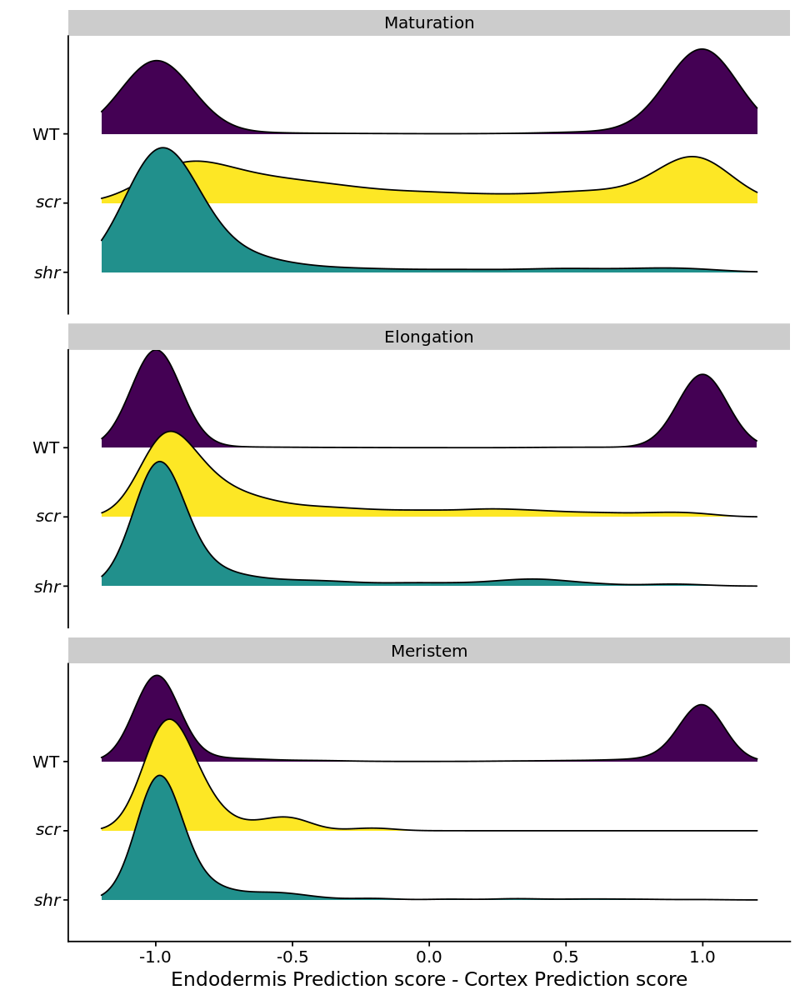

In [67]:
options(repr.plot.width=8, repr.plot.height=10)
pred_plot <- pred_plot + facet_wrap(~ factor(timezone, levels=c("Maturation","Elongation","Meristem")), ncol = 1) + theme(legend.title = element_blank())
pred_plot

x,y,t
<dbl>,<dbl>,<fct>
1,1.0,a
1,2.0,a
16,1.5,a
16,1.7,b
16,2.7,b
1,2.2,b


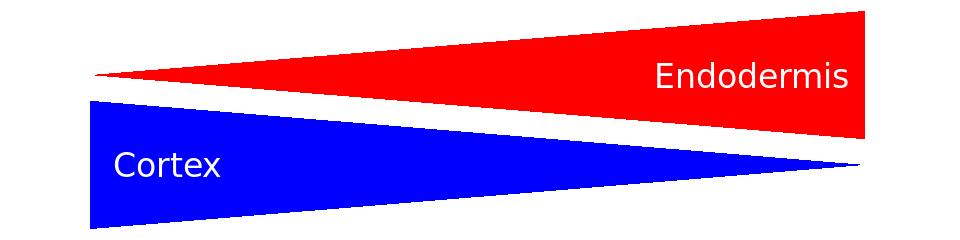

In [68]:
# make triangles 
options(repr.plot.width=8, repr.plot.height=2)

d=data.frame(x=c(1,1,16, 16,16,1), y=c(1,2,1.5, 1.7,2.7,2.2), t=c('a', 'a', 'a', 'b', 'b', 'b'))
d
triangle_label <- ggplot() +
geom_polygon(data=d, mapping=aes(x=x, y=y, group=t, fill=t)) + annotate("text", x = 2.5, y = 1.5, label = "Cortex", size = 7, color="white") + 
annotate("text", x = 13.8, y = 2.2, label = "Endodermis", size = 7, color="white") + 
scale_fill_manual(values=(c("blue", "red"))) + theme_nothing() + scale_x_continuous(limits=c(0.1, 17))

triangle_label

Picking joint bandwidth of 0.13

Picking joint bandwidth of 0.0907

Picking joint bandwidth of 0.0809



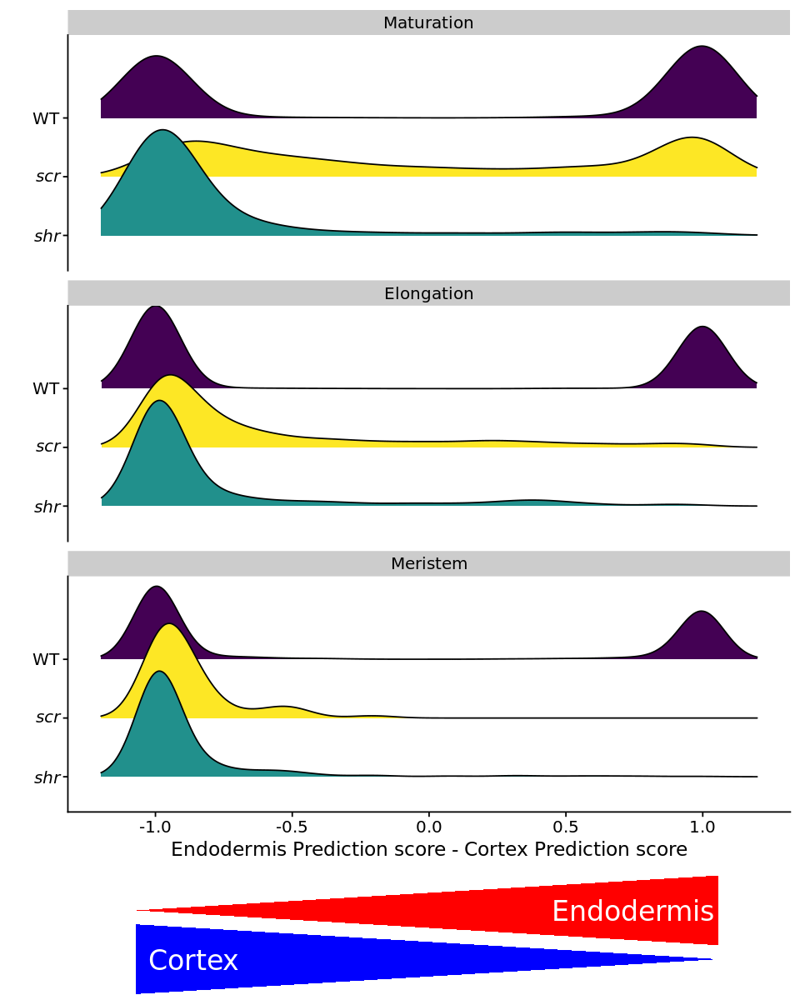

In [69]:
options(repr.plot.width=8, repr.plot.height=10)

(pred_tri <- plot_grid(pred_plot, triangle_label, ncol=1, rel_heights = c(1, .15), align="v"))

In [70]:
rc.integrated$Endodermis_Cortex_diff <- rc.integrated$prediction.score.Cortex - rc.integrated$prediction.score.Endodermis

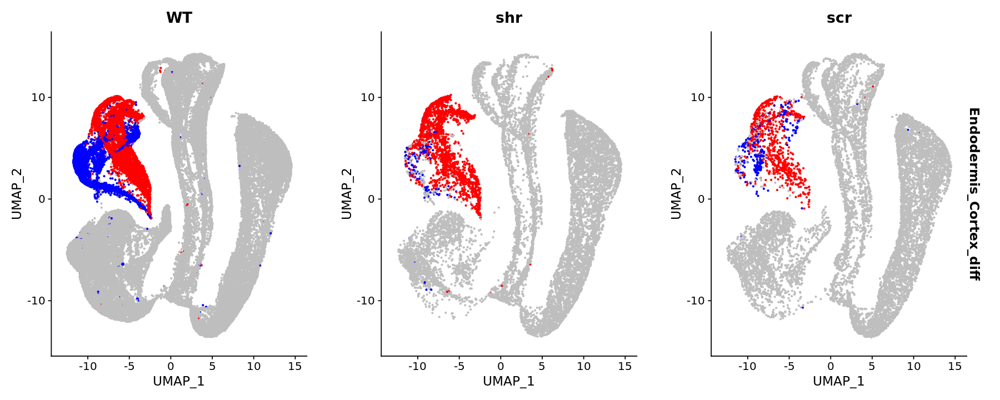

In [71]:
options(repr.plot.width=15, repr.plot.height=6)

FeaturePlot(rc.integrated, features = "Endodermis_Cortex_diff",
    cols = c("blue", "grey", "red"), label=F, repel=F, pt.size = 0.5, split.by="geno_trt")

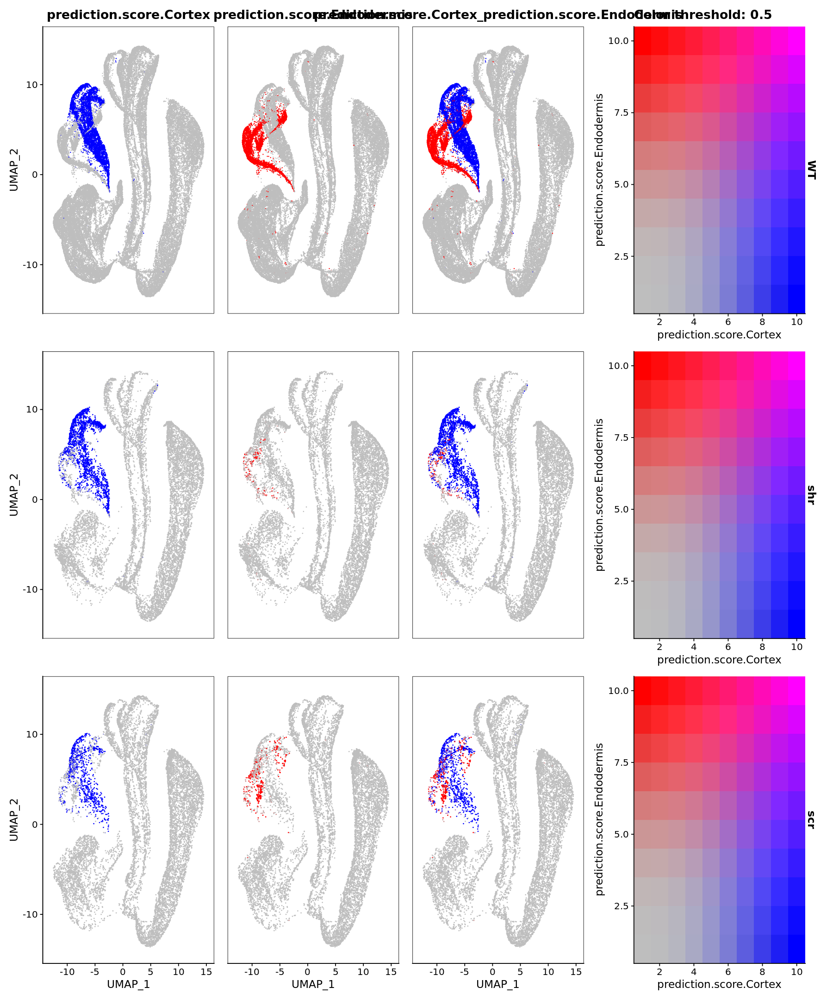

In [72]:
options(repr.plot.width=15, repr.plot.height=18)
# Visualize co-expression of two features simultaneously
FeaturePlot(rc.integrated, features = c("prediction.score.Cortex", "prediction.score.Endodermis"), blend = TRUE, split.by="geno_trt", cols = c("grey","blue", "red"))

In [73]:
WT_ground <- readRDS("./supp_data/Ground_Tissue_Atlas.rds")

In [74]:
scr_ground <- readRDS("./supp_data/Ground_Tissue_scr.rds")

In [75]:
shr_ground <- readRDS("./supp_data/Ground_Tissue_shr.rds")

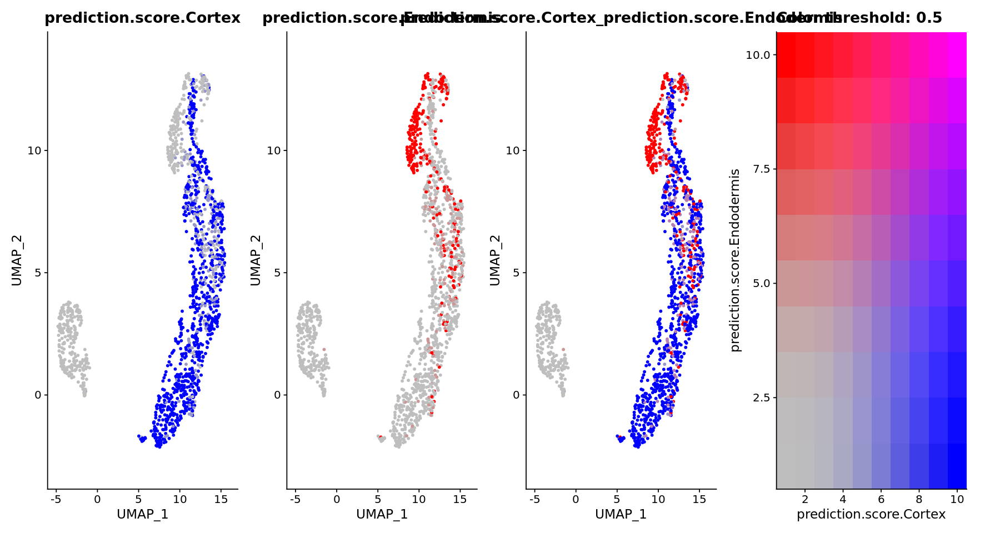

In [76]:
options(repr.plot.width=15, repr.plot.height=8)
# Visualize co-expression of two features simultaneously
FeaturePlot(scr_ground, features = c("prediction.score.Cortex", "prediction.score.Endodermis"), blend = TRUE, cols = c("grey","blue", "red"), min.cutoff = 0, max.cutoff = 1)

In [77]:
summary(scr_ground$prediction.score.Cortex)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.02845 0.74804 0.56686 0.95337 1.00000 

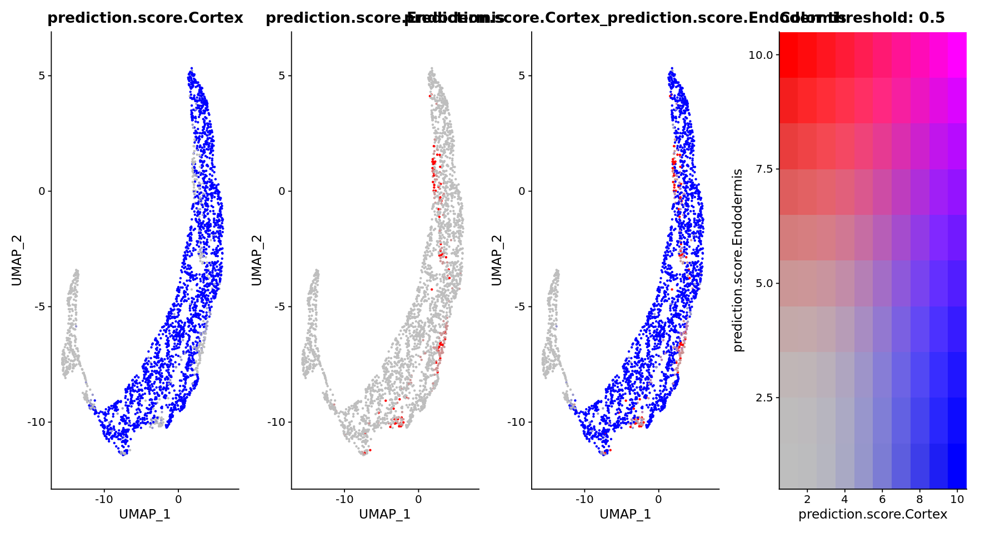

In [78]:
options(repr.plot.width=15, repr.plot.height=8)
# Visualize co-expression of two features simultaneously
FeaturePlot(shr_ground, features = c("prediction.score.Cortex", "prediction.score.Endodermis"), blend = TRUE, cols = c("grey","blue", "red"), min.cutoff = 0, max.cutoff = 1)

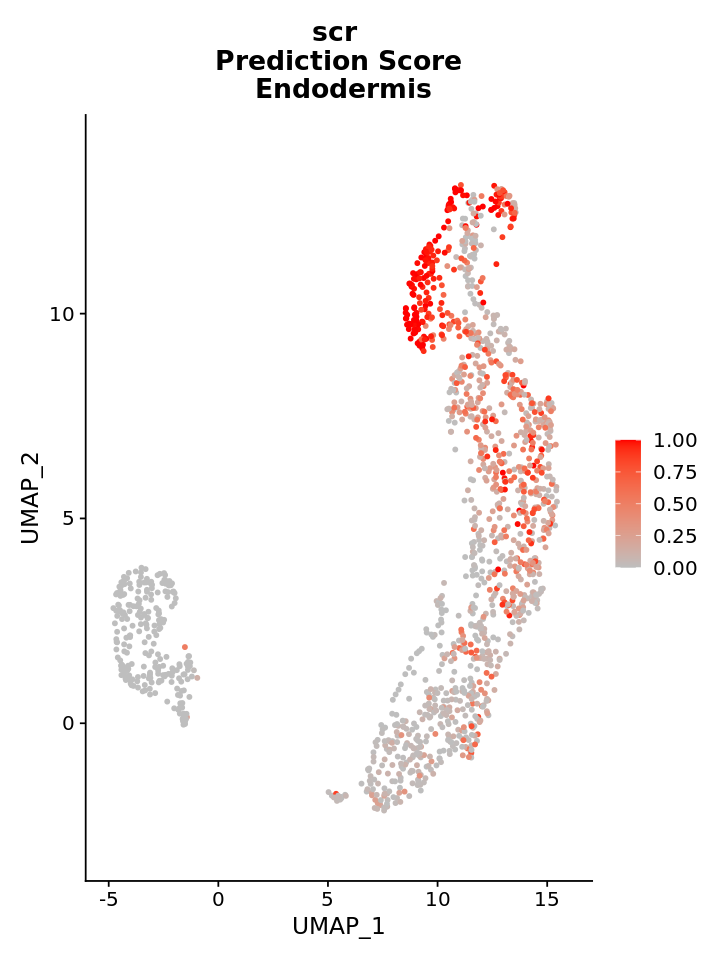

In [79]:
options(repr.plot.width=6, repr.plot.height=8)
# Visualize co-expression of two features simultaneously
(scr_e <- FeaturePlot(scr_ground, features = c("prediction.score.Endodermis"), cols = c("grey", "red"), min.cutoff = 0, max.cutoff = 1) + ggtitle("scr \n Prediction Score \n Endodermis"))

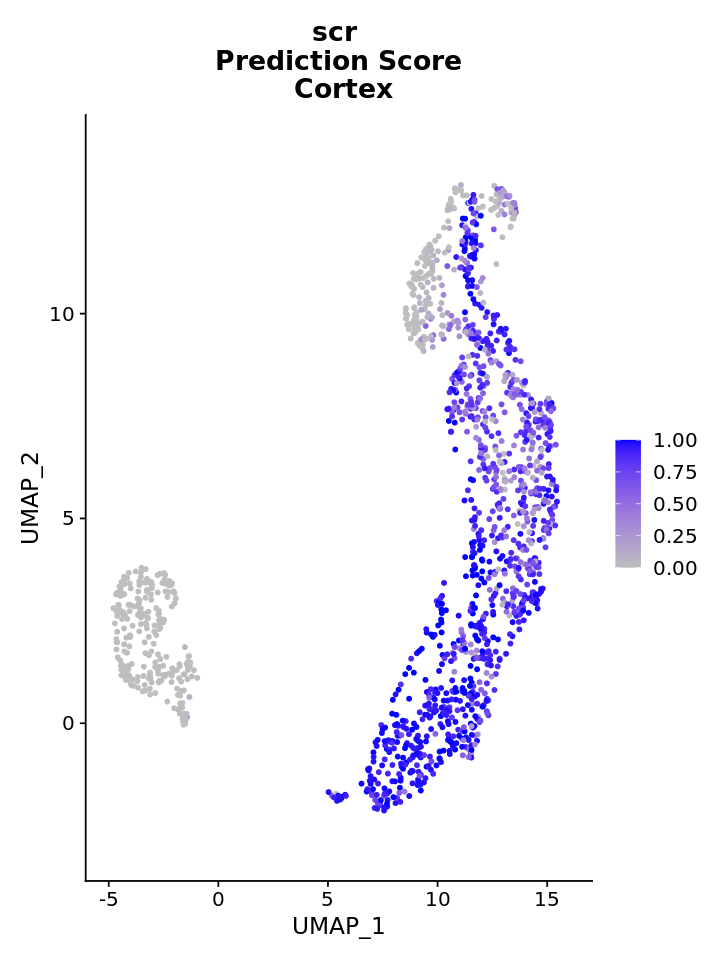

In [80]:
options(repr.plot.width=6, repr.plot.height=8)
# Visualize co-expression of two features simultaneously
(scr_c <- FeaturePlot(scr_ground, features = c("prediction.score.Cortex"), cols = c("grey", "blue"), min.cutoff = 0, max.cutoff = 1) + ggtitle("scr \n Prediction Score \n Cortex"))

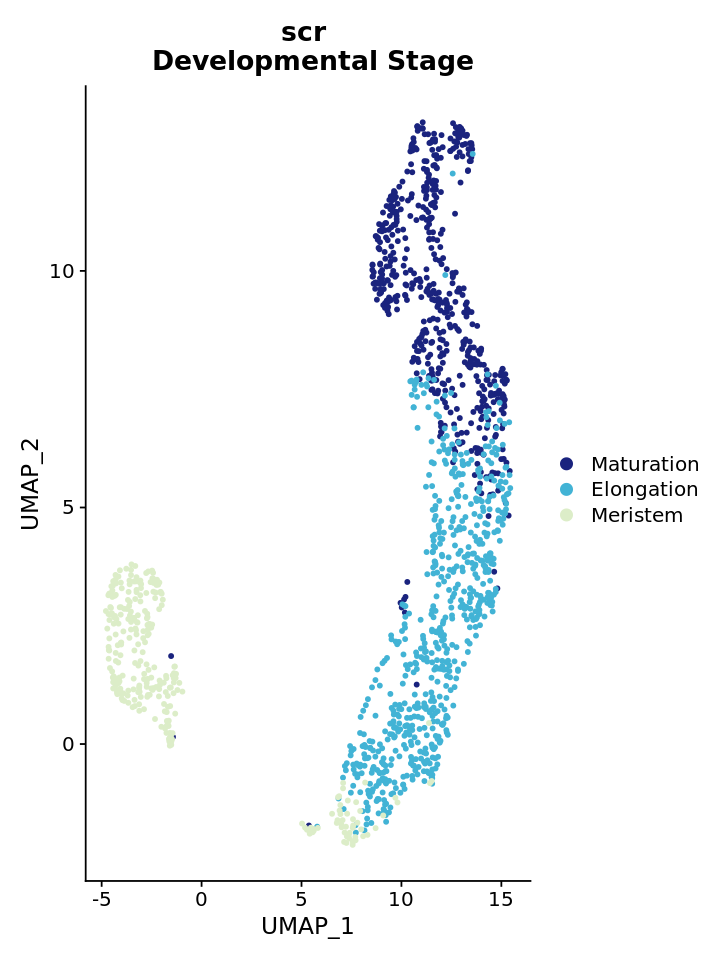

In [81]:
scr_time_plt <- DimPlot(scr_ground, 
        group.by = "time.anno", 
        order = c("Meristem","Elongation","Maturation"),
        cols = c("#1A237E", "#42B3D5", "#DCEDC8")) + ggtitle("scr \n Developmental Stage") + theme(plot.title = element_text(hjust = 0.5))
scr_time_plt 

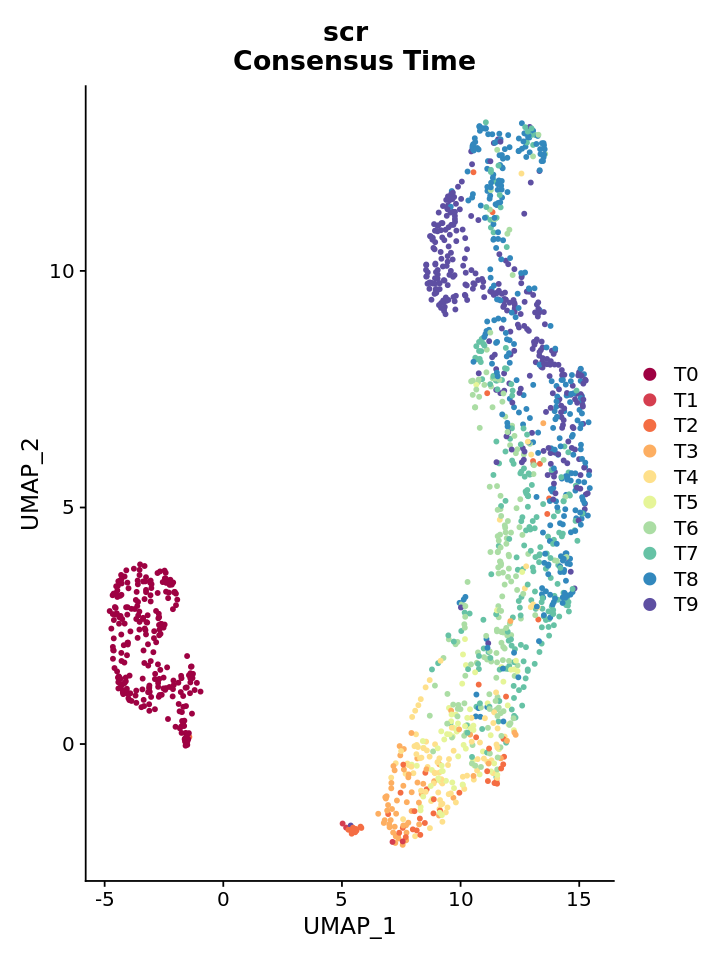

In [82]:
options(repr.plot.width=6, repr.plot.height=8)
scr_ct_plt <-DimPlot(scr_ground, reduction = "umap", group.by = "consensus.time.group", cols=brewer.pal(10,"Spectral")) + ggtitle("scr \n Consensus Time") + theme(plot.title = element_text(hjust = 0.5))
scr_ct_plt 

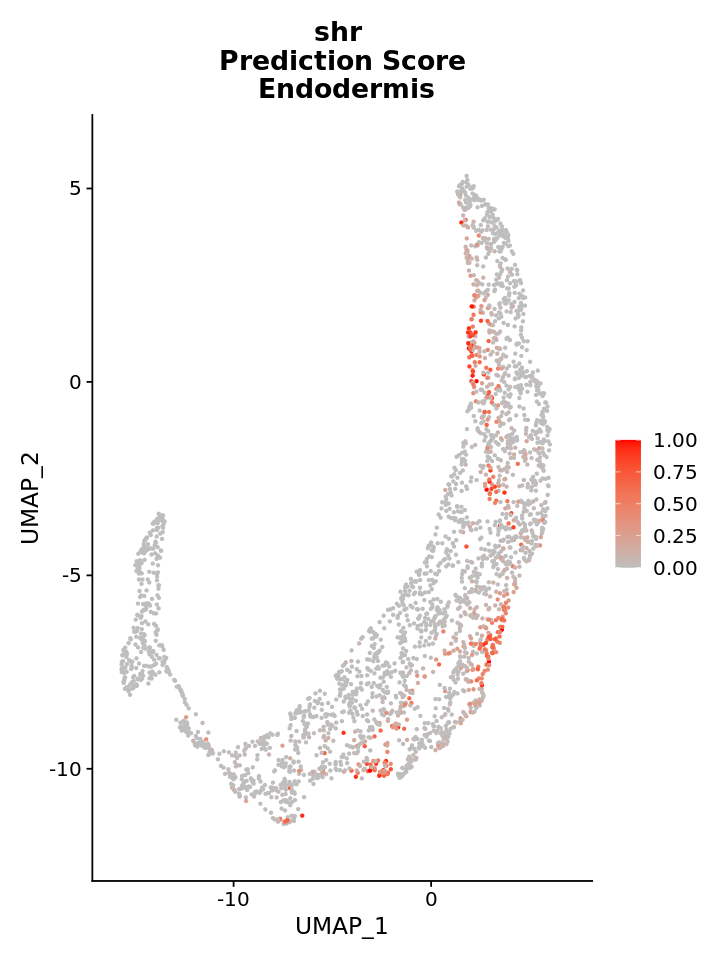

In [83]:
options(repr.plot.width=6, repr.plot.height=8)
# Visualize co-expression of two features simultaneously
(shr_e <- FeaturePlot(shr_ground, features = c("prediction.score.Endodermis"), cols = c("grey", "red"), min.cutoff = 0, max.cutoff = 1) + ggtitle("shr \n Prediction Score \n Endodermis"))

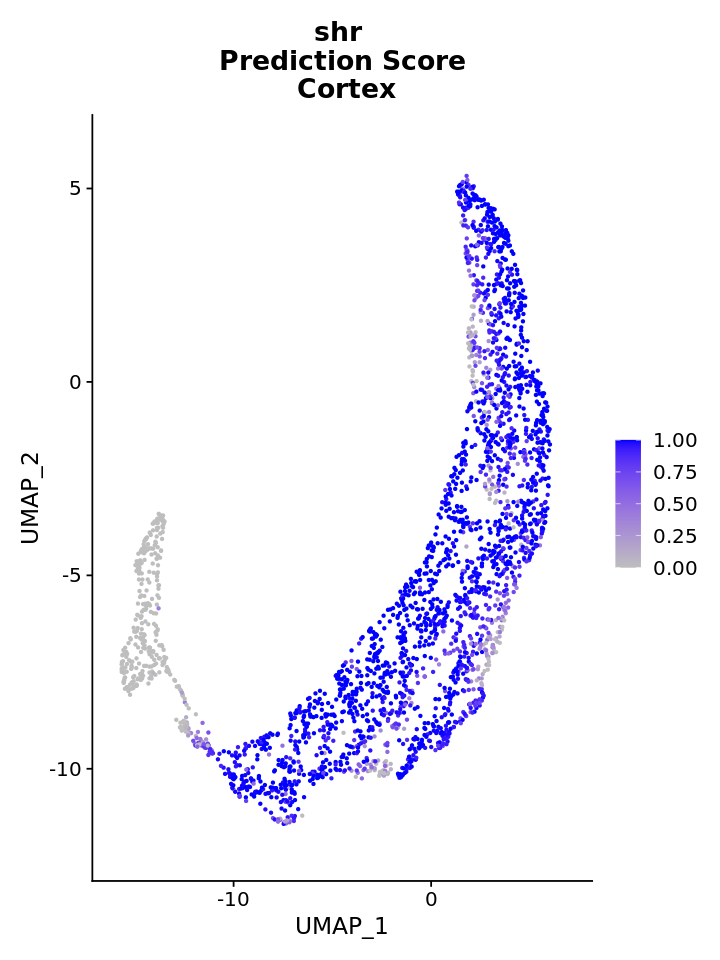

In [84]:
options(repr.plot.width=6, repr.plot.height=8)
# Visualize co-expression of two features simultaneously
(shr_c <- FeaturePlot(shr_ground, features = c("prediction.score.Cortex"), cols = c("grey", "blue"), min.cutoff = 0, max.cutoff = 1) + ggtitle("shr \n Prediction Score \n Cortex"))

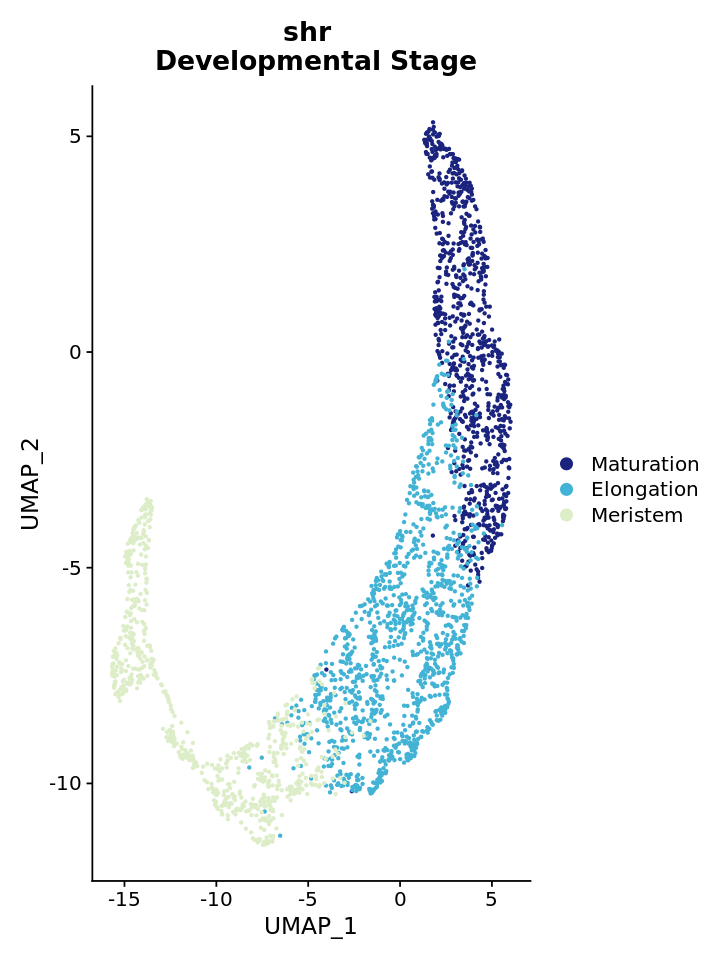

In [85]:
shr_time_plt <- DimPlot(shr_ground, 
        group.by = "time.anno", 
        order = c("Meristem","Elongation","Maturation"),
        cols = c("#1A237E", "#42B3D5", "#DCEDC8")) + ggtitle("shr \n Developmental Stage") + theme(plot.title = element_text(hjust = 0.5))
shr_time_plt 

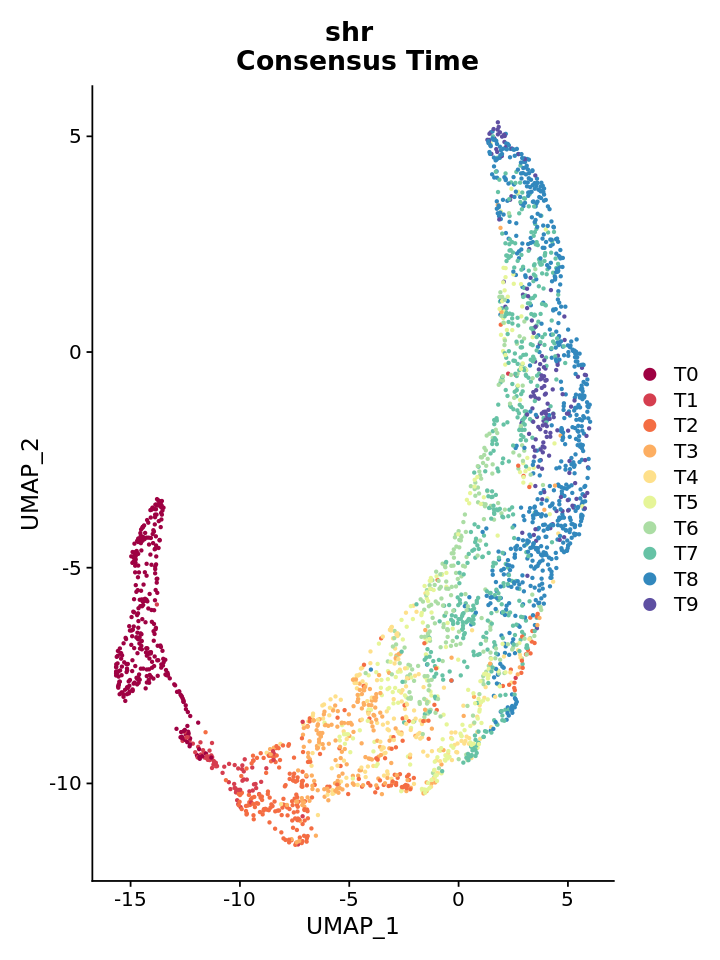

In [86]:
options(repr.plot.width=6, repr.plot.height=8)
shr_ct_plt <-DimPlot(shr_ground, reduction = "umap", group.by = "consensus.time.group", cols=brewer.pal(10,"Spectral")) + ggtitle("shr \n Consensus Time") + theme(plot.title = element_text(hjust = 0.5))
shr_ct_plt 

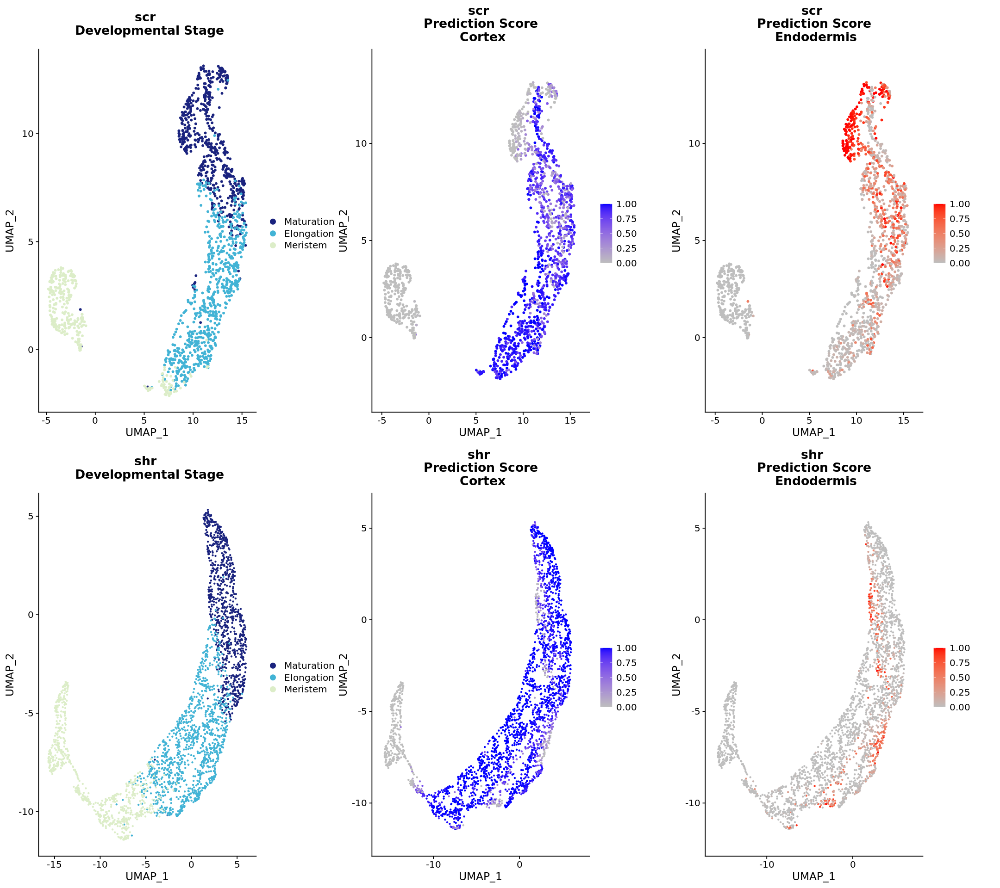

In [87]:
options(repr.plot.width=18, repr.plot.height=16)
(pred_dim_plots <- plot_grid(scr_time_plt, scr_c, scr_e, shr_time_plt, shr_c, shr_e, ncol=3, align="hv"))

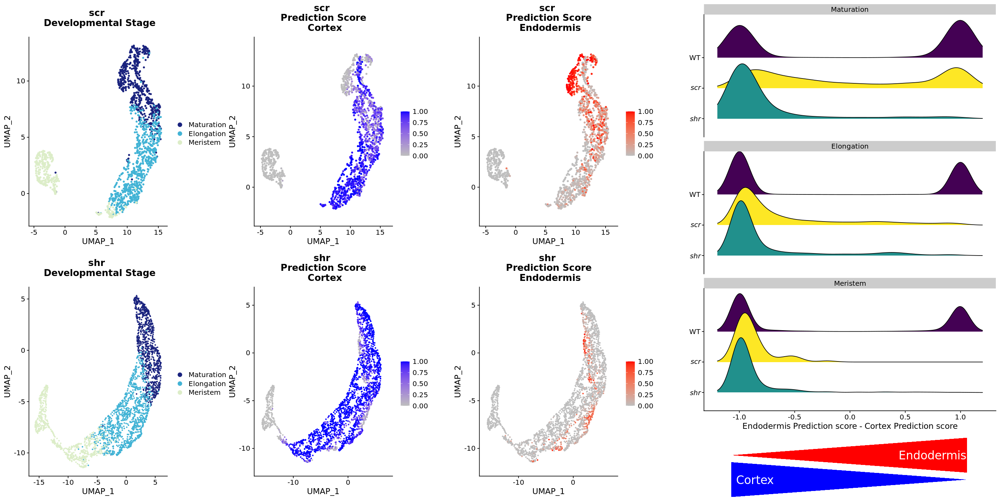

In [88]:
options(repr.plot.width=24, repr.plot.height=12)

plot_grid(pred_dim_plots, pred_tri, ncol=2, rel_widths = c(2.5,1.2))

ggsave("./supp_data/scr_shr_pred_dim.pdf", width=30, height=12)

Picking joint bandwidth of 0.102



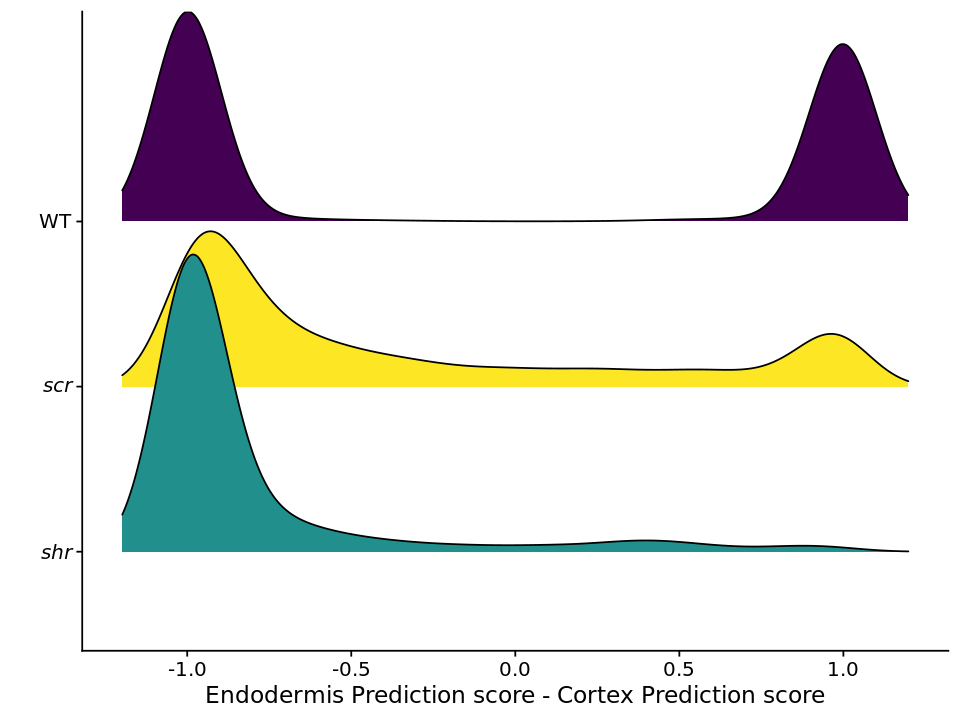

In [89]:
options(repr.plot.width=8, repr.plot.height=6)
pred_plot <- anno_scores %>% filter(annotation %in% c("Cortex", "Endodermis")) %>% filter(is.na(prediction.score.Cortex)==F) %>% 
mutate(Cortex__Endo_diff=prediction.score.Endodermis-prediction.score.Cortex)  %>%
ggplot(aes(y=factor(geno, levels=c("shr", "scr", "WT")), x=Cortex__Endo_diff, fill=geno)) + geom_density_ridges(rel_min_height = 0.00) 

mylabels <- c( 
              expression(italic("shr")),
                expression(italic("scr")), "WT")

pred_plot <- pred_plot + 
theme_cowplot() + 
xlab("Endodermis Prediction score - Cortex Prediction score") + 
ylab("") + 
scale_fill_viridis_d(labels = rev(mylabels)) + 
scale_x_continuous(limits=c(-1.2, 1.2)) + 
scale_y_discrete(labels = mylabels) + theme(legend.position = "none")
pred_plot

Picking joint bandwidth of 0.146

Picking joint bandwidth of 0.14

Picking joint bandwidth of 0.0599

Picking joint bandwidth of 0.117

Picking joint bandwidth of 0.128

Picking joint bandwidth of 0.0892

Picking joint bandwidth of 0.0854

Picking joint bandwidth of 0.185

Picking joint bandwidth of 0.15

Picking joint bandwidth of 0.231



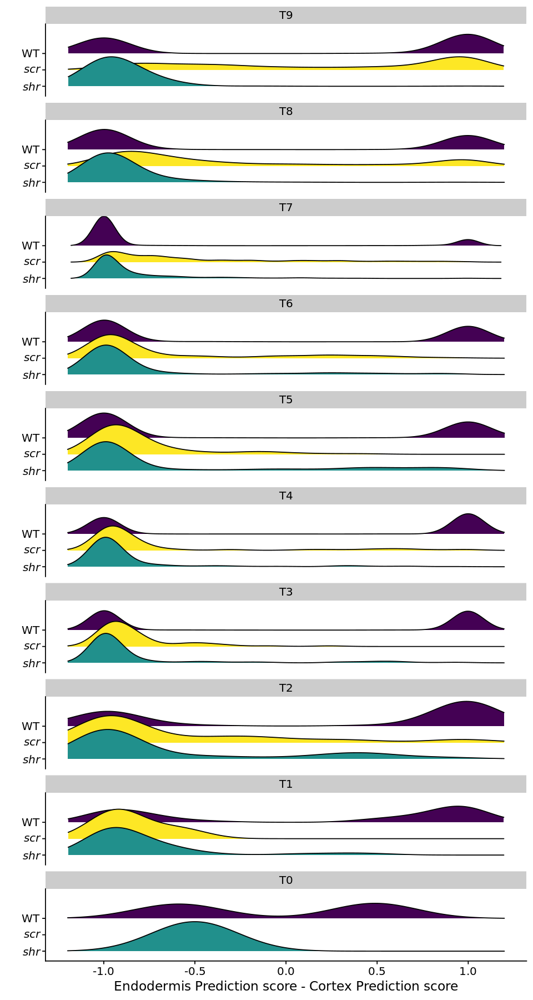

In [90]:
options(repr.plot.width=8, repr.plot.height=15)

con_time_order <- c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9")
con_time_order <- rev(con_time_order)


pred_plot <- pred_plot + facet_wrap(~ factor(consensus.time, levels=con_time_order), ncol = 1) + theme(legend.title = element_blank())
pred_plot

Picking joint bandwidth of 0.146

Picking joint bandwidth of 0.14

Picking joint bandwidth of 0.0599

Picking joint bandwidth of 0.117

Picking joint bandwidth of 0.128

Picking joint bandwidth of 0.0892

Picking joint bandwidth of 0.0854

Picking joint bandwidth of 0.185

Picking joint bandwidth of 0.15

Picking joint bandwidth of 0.231



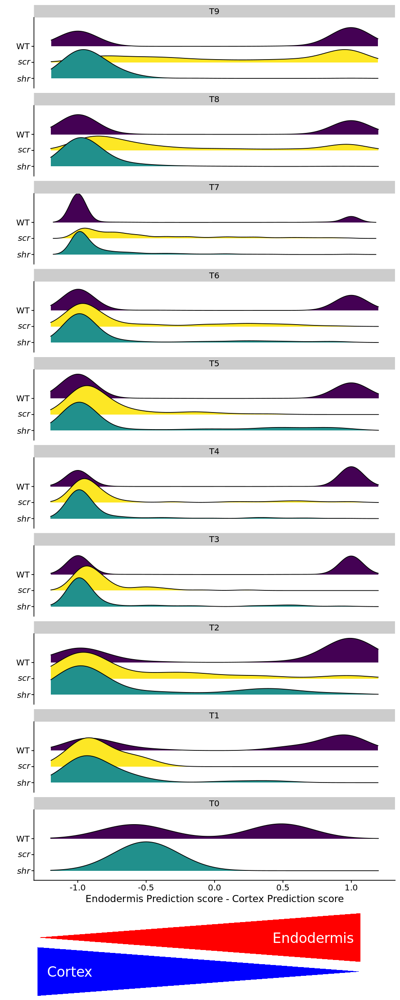

In [91]:
options(repr.plot.width=8, repr.plot.height=20)

(pred_tri <- plot_grid(pred_plot, triangle_label, ncol=1, rel_heights = c(1, .1)))

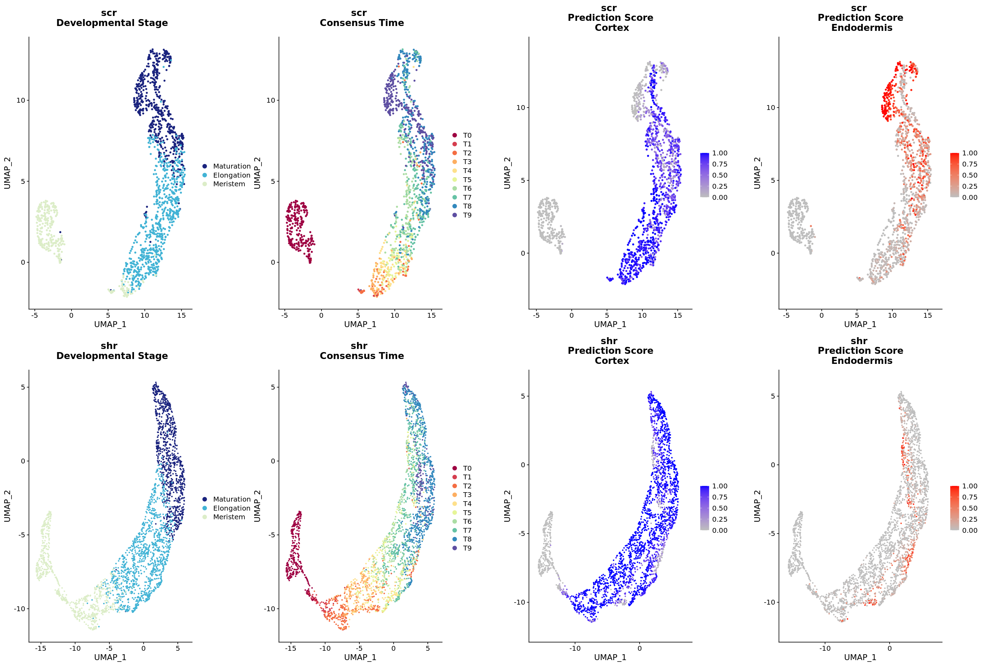

In [92]:
options(repr.plot.width=24, repr.plot.height=16)
(pred_dim_plots <- plot_grid(scr_time_plt, scr_ct_plt, scr_c, scr_e, shr_time_plt, shr_ct_plt, shr_c, shr_e, ncol=4, align="hv"))

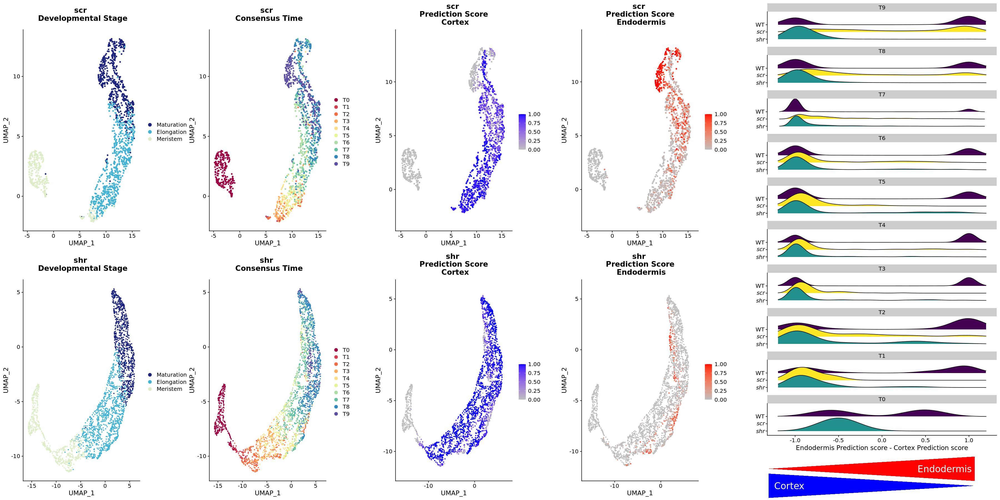

In [93]:
options(repr.plot.width=30, repr.plot.height=15)

plot_grid(pred_dim_plots, pred_tri, ncol=2, rel_widths = c(3.5,1.2))

ggsave("./supp_data/scr_shr_pred_dim_with_consensus_time.pdf", width=30, height=15)